#### Bibliotecas utilizadas

In [1687]:
import cv2
import h5py
import numpy as np
import scipy.io as sio
import matplotlib.pyplot as plt
from scipy import linalg 
from scipy.optimize import least_squares
from matplotlib.image import imread
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go
from plotly.subplots import make_subplots

#### Item I - Cálculo da matriz de projeção da câmera P e os parâmetros K, R e t das correspondências dos pontos no mundo real "world.txt" com os pontos correspondentes na imagem "image.txt".

##### Carregando as coordenadas 

In [446]:
folder         = 'Arquivos//' # Diretório onde estâo os arquivos
filename_world = 'world.txt'  # Arquivo com as coordenadas no mundo 3D
filename_image = 'image.txt'  # Arquivo com as coordenadas na imagem 2D

x_world = []  # Lista para armazenar as coordenadas 3D do mundo
x_image = []  # Lista para armazenar as coordenadas 2D da imagem

# Abre os dois arquivos em modo leitura
with open((folder + filename_world), 'r') as file_world, open((folder + filename_image), 'r') as file_img:
    txt_world = (file_world.read()).split()  # Lê o arquivo 'world.txt' e divide em uma lista de strings
    txt_img   = (file_img.read()).split()   # Lê o arquivo 'image.txt' e divide em uma lista de strings

    # Constrói a lista de coordenadas 3D a partir de 'world.txt'
    # Cada coordenada 3D é composta por três valores consecutivos (x, y, z)
    for i in range(0, len(txt_world), 3):
        x_world.append([float(txt_world[i]), float(txt_world[i+1]), float(txt_world[i+2])])
    
    # Constrói a lista de coordenadas 2D a partir de 'image.txt'
    # Cada coordenada 2D é composta por dois valores consecutivos (x, y)
    for i in range(0, len(txt_img), 2):
        x_image.append([float(txt_img[i]), float(txt_img[i+1])])

    # Converte as listas para arrays NumPy para facilitar cálculos futuros
    x_world = np.array(x_world)
    x_image = np.array(x_image)

##### Cálculo da matriz da câmera e dos seus parâmetros

In [449]:
# Encontra a matriz de câmera P a partir dos pontos 2D (x_image) e 3D (x_world)
P = find_projection_camera_matrix(x_image, x_world)

# Decompõe a matriz de câmera P1 em seus parâmetros intrínsecos (K), rotação (R) e translação (t)
K, R, t, _, _ = find_camera_parameters(P)

# Exibe a matriz de câmera projetiva P
print("Matriz de Câmera P:")
print(P)
print("")

# Exibe os parâmetros intrínsecos da câmera
print("Matriz Intrínseca K:")
print(K)
print("")

# Exibe a matriz de rotação
print("Matriz de Rotação R:")
print(R)
print("")

# Exibe o vetor de translação
print("Vetor de Translação t:")
print(t)

Matriz de Câmera P:
[[  7.75289611 -15.23815576  -6.04421973   4.82634985]
 [  4.11711235  -8.69594064  -3.47272939   2.82214708]
 [  1.00544631  -2.05568744  -0.83532381   0.65336615]]

Matriz Intrínseca K:
[[ 0.00188664  0.06222383 -0.08167015]
 [ 0.          0.03113764 -0.43826734]
 [ 0.          0.          1.        ]]

Matriz de Rotação R:
[[ 0.87745497  0.46596532  0.1137941 ]
 [ 0.47599761 -0.87515495 -0.08677613]
 [ 0.05915281  0.13030787 -0.98970743]]

Vetor de Translação t:
[4.82634985 2.82214708 0.65336615]


#### Item II - Decomposição RQ das matrizes P1 e P2

##### Definição das matrizes

In [453]:
# Definindo a matriz de câmera P1
P1 = np.array([
    [800 / np.sqrt(2), 0, 2400 / np.sqrt(2), 4000],
    [-700 / np.sqrt(2), 1400,  700 / np.sqrt(2), 4900],
    [-1 / np.sqrt(2), 0, 1 / np.sqrt(2), 3]
])

# Definindo a matriz de câmera P2
P2 = np.array([
    [1000, -250, 250 * np.sqrt(3), 500],
    [0, 500 * (np.sqrt(3) - (1 / 2)), 500 * (1 + (np.sqrt(3) / 2)), 500],
    [0, -(1 / 2), np.sqrt(3) / 2, 1]
])

##### Cálculo dos parâmetros

In [456]:
# Decompõe P1 em K1 (matriz intrínseca), R1 (rotação) e t1 (translação)
K1, R1, t1, _, _ = find_camera_parameters(P1)

# Decompõe P2 em K2 (matriz intrínseca), R2 (rotação) e t2 (translação)
K2, R2, t2, _, _ = find_camera_parameters(P2)

# Exibindo os resultados de P1
print("Matriz P1")
print("Matriz Intrínseca K1:")
print(K1)
print("")
print("Matriz de Rotação R1:")
print(R1)
print("")
print("Vetor de Translação t1:")
print(t1)
print("")

# Exibindo os resultados de P2
print("Matriz P2")
print("Matriz Intrínseca K2:")
print(K2)
print("")
print("Matriz de Rotação R2:")
print(R2)
print("")
print("Vetor de Translação t2:")
print(t2)

Matriz P1
Matriz Intrínseca K1:
[[ 3.76287887e-03  3.29251644e-03 -2.99999375e+00]
 [ 0.00000000e+00  2.68451420e-03 -1.41421135e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]

Matriz de Rotação R1:
[[ 7.52576362e-01 -6.58504316e-01 -9.40720452e-04]
 [ 6.58503802e-01  7.52576950e-01 -8.23129753e-04]
 [ 1.24999902e-03  0.00000000e+00  9.99999219e-01]]

Vetor de Translação t1:
[4.0e+03 4.9e+03 3.0e+00]

Matriz P2
Matriz Intrínseca K2:
[[ 1.62330914e-03  6.58783144e-04 -8.11654304e-01]
 [ 0.00000000e+00  2.63513258e-03 -1.51456641e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]

Matriz de Rotação R2:
[[ 1.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  9.99999671e-01 -8.11654572e-04]
 [ 0.00000000e+00  8.11654572e-04  9.99999671e-01]]

Vetor de Translação t2:
[500. 500.   1.]


##### Matrizes normalizadas

In [459]:
# Normalizando P1 e P2 dividindo cada elemento pelo último elemento da matriz (P[-1, -1])
P1_normalizada = P1 / P1[-1, -1]
P2_normalizada = P2 / P2[-1, -1]

# Exibindo a matriz P1 normalizada
print("Matriz P1 Normalizada:")
print(P1_normalizada)
print("")

# Exibindo a matriz P2 normalizada
print("Matriz P2 Normalizada:")
print(P2_normalizada)

Matriz P1 Normalizada:
[[ 1.88561808e+02  0.00000000e+00  5.65685425e+02  1.33333333e+03]
 [-1.64991582e+02  4.66666667e+02  1.64991582e+02  1.63333333e+03]
 [-2.35702260e-01  0.00000000e+00  2.35702260e-01  1.00000000e+00]]

Matriz P2 Normalizada:
[[ 1.00000000e+03 -2.50000000e+02  4.33012702e+02  5.00000000e+02]
 [ 0.00000000e+00  6.16025404e+02  9.33012702e+02  5.00000000e+02]
 [ 0.00000000e+00 -5.00000000e-01  8.66025404e-01  1.00000000e+00]]


#### Item III - Cálculo da matriz fundamental das matrizes de projeção do item II

##### Cálculo da matriz fundamental F que relaciona as matrizes das câmeras 

In [665]:
# Calcula o centro da câmera C (null space de P1_normalizada)
C = linalg.null_space(P1_normalizada)  # Espaço nulo da matriz P1_normalizada
C = C / C[-1]  # Normaliza para garantir que o último elemento seja 1

# Calcula a pseudo-inversa de P1_normalizada
P1_inv = linalg.pinv(P1_normalizada)

# Calcula o epipolo e_lin (P1_normalizada @ C)
e_lin = P1_normalizada @ C
e_lin = e_lin / e_lin[-1]  # Normaliza para garantir que o último elemento seja 1

# Cria a matriz anti-simétrica E_lin a partir de e_lin
E_lin = np.array([
    [0, -e_lin[2, 0], e_lin[1, 0]], 
    [e_lin[2, 0], 0, -e_lin[0, 0]], 
    [-e_lin[1, 0], e_lin[0, 0], 0]
])

# Calcula a matriz fundamental F usando E_lin, P2_normalizada e P1_inv
F = E_lin @ (P2_normalizada @ P1_inv) 
F = F / F[-1,-1]

# Exibe a matriz fundamental
print("Matriz Fundamental F:")
print(F)

Matriz Fundamental F:
[[ 1.89997575e-05 -8.56469265e-06  6.13843329e-03]
 [-4.20997668e-05  2.60668526e-05 -1.13003041e-02]
 [-4.19865798e-03  9.15196650e-03  1.00000000e+00]]


#### Item IV - Cálculo das matrizes fundamentais utilizando o algoritmo de 8 pontos para cada par de imagens 

##### 1 - Sem forçar a condição de posto 2

##### Imagens ex_12_F_eins.jpg e ex_12_F_zwei.jpg

##### Carregando as imagens e obtendo as correspondências utilizando o detector SIFT

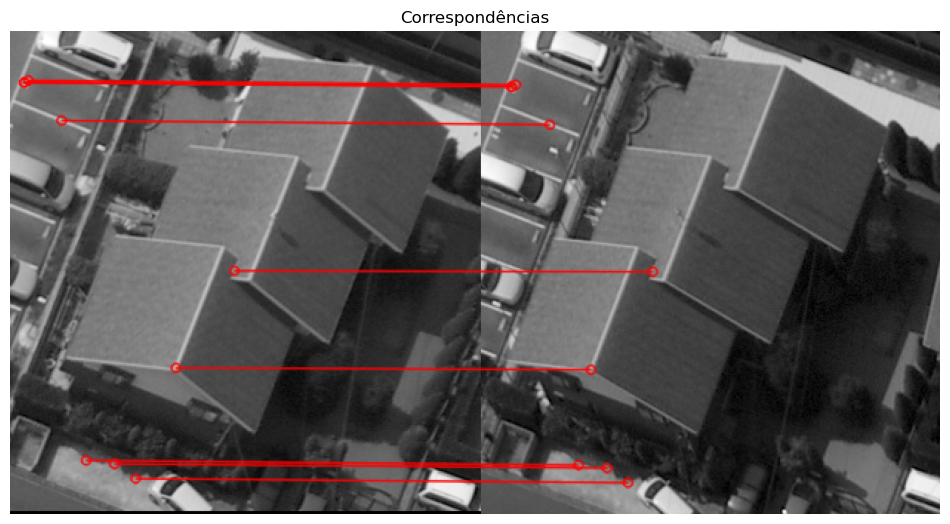

In [469]:
ex_12_F_eins = cv2.imread('Imagens//ex-12-F-eins.jpg', cv2.IMREAD_GRAYSCALE) # Carrega as imagens em escala de cinza
ex_12_F_zwei = cv2.imread('Imagens//ex-12-F-zwei.jpg', cv2.IMREAD_GRAYSCALE)

ex_12_F_eins_rgb = plt.imread('Imagens//ex-12-F-eins.jpg') # Carrega as imagens em RGB
ex_12_F_zwei_rgb = plt.imread('Imagens//ex-12-F-zwei.jpg')

sift = cv2.SIFT_create() # Inicia o detector SIFT

# Encontra os keypoints e descritores
keypoint1, descriptors1 = sift.detectAndCompute(ex_12_F_eins, None)
keypoint2, descriptors2 = sift.detectAndCompute(ex_12_F_zwei, None)

# Configura o FLANN matcher
index_params  = dict(algorithm=0, trees=20)
search_params = dict(checks=150)
flann = cv2.FlannBasedMatcher(index_params, search_params)

# Encontra as correspondências usando KNN
matches = flann.knnMatch(descriptors1, descriptors2, k=2)

# Aplica o Ratio Test
ratio = 0.33
best_matches = []
for m, n in matches:
    if m.distance < ratio * n.distance:
        best_matches.append(m)

# Plota as imagens com as correspondências
matched_image = cv2.drawMatches(ex_12_F_eins, keypoint1, ex_12_F_zwei, keypoint2, best_matches, None,
                                 matchColor=(255, 0 , 0), singlePointColor=(0, 255, 0), flags=2)

plt.figure(figsize=(12, 10))
plt.imshow(matched_image)
plt.title("Correspondências")
plt.axis("off")
plt.show()

# Extrai as coordenadas dos pontos correspondentes
ex_12_F_eins_kpts = [] # Pontos na imagem 1
ex_12_F_zwei_kpts = [] # Pontos correspondentes na imagem 2

for match in best_matches:
    ex_12_F_eins_kpts.append(keypoint1[match.queryIdx].pt)
    ex_12_F_zwei_kpts.append(keypoint2[match.trainIdx].pt)

ex_12_F_eins_kpts = np.array(ex_12_F_eins_kpts)
ex_12_F_zwei_kpts = np.array(ex_12_F_zwei_kpts)

##### Obtendo a matriz fundamental 

In [663]:
F1 = normalized_8_point_algorithm(ex_12_F_eins_kpts, ex_12_F_zwei_kpts, False)
F1 = F1 / F1[-1,-1]

print("")
print("Matriz Fundamental F:")
print(F1)


Matriz Fundamental F:
[[ 3.56872726e-05 -1.81834902e-04  4.08351622e-02]
 [ 1.14162116e-04  4.32162233e-05 -4.12108901e-01]
 [-3.36668607e-02  4.02752339e-01  1.00000000e+00]]


##### Plotando as linhas epipolares

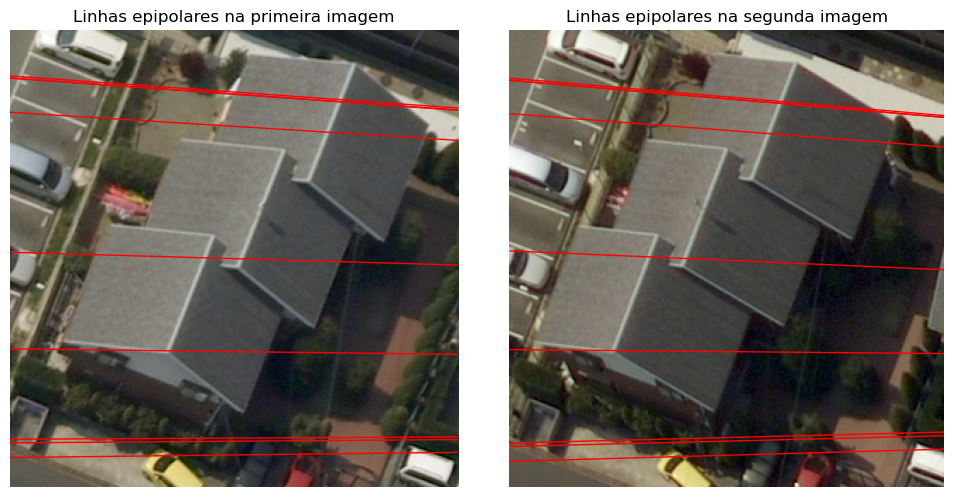

In [475]:
plot_epipolar_lines(ex_12_F_eins_rgb, ex_12_F_zwei_rgb, ex_12_F_eins_kpts, ex_12_F_zwei_kpts, F1)

##### Imagens chapel00.png e chapel01.png

##### Carregando as imagens e obtendo as correspondências utilizando o detector SIFT

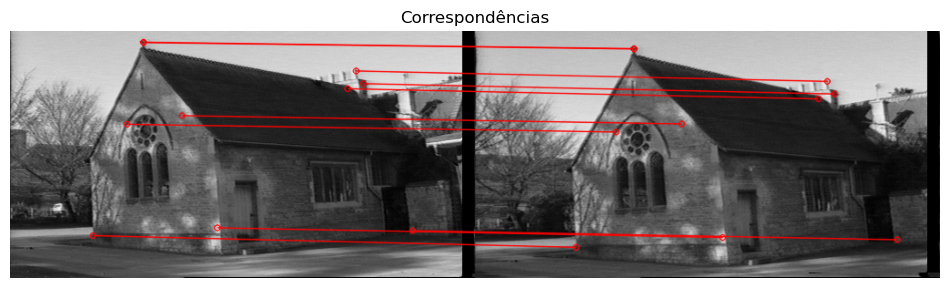

In [479]:
chapel00 = cv2.imread('Imagens//chapel00.png', cv2.IMREAD_GRAYSCALE) # Carrega as imagens
chapel01 = cv2.imread('Imagens//chapel01.png', cv2.IMREAD_GRAYSCALE)

chapel00_rgb = plt.imread('Imagens//chapel00.png') # Carrega as imagens em RGB
chapel01_rgb = plt.imread('Imagens//chapel01.png')

sift = cv2.SIFT_create() # Inicia o detector SIFT

# Encontra os keypoints e descritores
keypoint1, descriptors1 = sift.detectAndCompute(chapel00, None)
keypoint2, descriptors2 = sift.detectAndCompute(chapel01, None)

# Configura o FLANN matcher
index_params  = dict(algorithm=0, trees=20)
search_params = dict(checks=150)
flann = cv2.FlannBasedMatcher(index_params, search_params)

# Encontra as correspondências usando KNN
matches = flann.knnMatch(descriptors1, descriptors2, k=2)

# Aplica o Ratio Test
ratio = 0.25
best_matches = []
for m, n in matches:
    if m.distance < ratio * n.distance:
        best_matches.append(m)

# Visualiza as correspondências
matched_image = cv2.drawMatches(chapel00, keypoint1, chapel01, keypoint2, best_matches, None,
                                 matchColor=(255, 0 , 0), singlePointColor=(0, 255, 0), flags=2)

plt.figure(figsize=(12, 10))
plt.imshow(matched_image)
plt.title("Correspondências")
plt.axis("off")
plt.show()

# Extrai as coordenadas dos pontos correspondentes
chapel00_kpts = [] # Pontos na imagem 1
chapel01_kpts = [] # Pontos correspondentes na imagem 2

for match in best_matches:
    chapel00_kpts.append(keypoint1[match.queryIdx].pt)
    chapel01_kpts.append(keypoint2[match.trainIdx].pt)

chapel00_kpts = np.array(chapel00_kpts)
chapel01_kpts = np.array(chapel01_kpts)

##### Obtendo a matriz fundamental 

In [661]:
F2 = normalized_8_point_algorithm(chapel00_kpts, chapel01_kpts, False)
F2 = F2 / F2[-1,-1]

print("")
print("Matriz Fundamental F:")
print(F2)


Matriz Fundamental F:
[[-5.67297267e-06 -1.82836228e-04  1.76430929e-02]
 [ 1.18144706e-04  2.00483975e-05 -4.81029424e-01]
 [-4.84061588e-03  5.01495004e-01  1.00000000e+00]]


##### Plotando as linhas epipolares

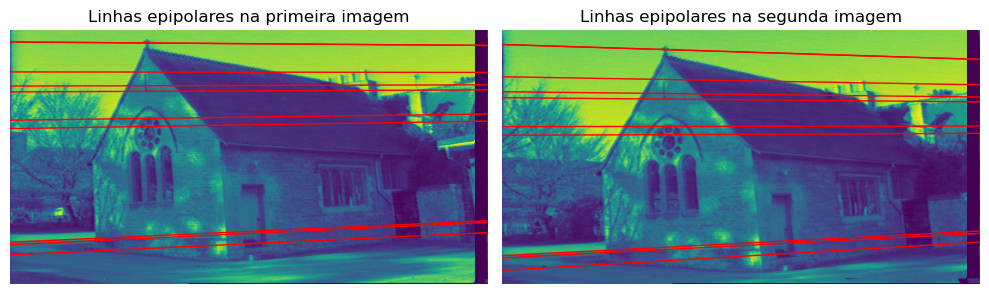

In [485]:
plot_epipolar_lines(chapel00_rgb, chapel01_rgb, chapel00_kpts, chapel01_kpts, F2)

##### Imagens keble000.png e keble003.png

##### Carregando as imagens e obtendo as correspondências utilizando o detector SIFT

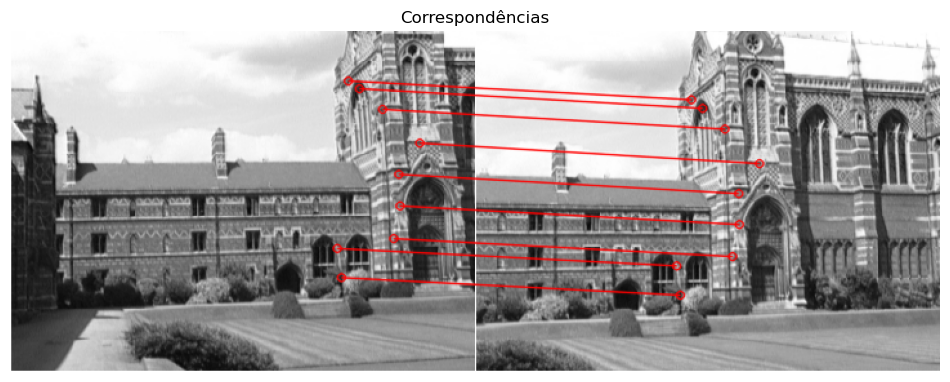

In [489]:
keble000 = cv2.imread('Imagens//keble000.png', cv2.IMREAD_GRAYSCALE) # Carrega as imagens
keble003 = cv2.imread('Imagens//keble003.png', cv2.IMREAD_GRAYSCALE)

keble000_rgb = plt.imread('Imagens//keble000.png') # Carrega as imagens em RGB
keble003_rgb = plt.imread('Imagens//keble003.png')

sift = cv2.SIFT_create() # Inicia o detector SIFT

# Encontra os keypoints e descritores
keypoint1, descriptors1 = sift.detectAndCompute(keble000, None)
keypoint2, descriptors2 = sift.detectAndCompute(keble003, None)

# Configura o FLANN matcher
index_params  = dict(algorithm=0, trees=20)
search_params = dict(checks=150)
flann = cv2.FlannBasedMatcher(index_params, search_params)

# Encontra as correspondências usando KNN
matches = flann.knnMatch(descriptors1, descriptors2, k=2)

# Aplica o Ratio Test
ratio = 0.172
best_matches = []
for m, n in matches:
    if m.distance < ratio * n.distance:
        best_matches.append(m)

# Visualiza as correspondências
matched_image = cv2.drawMatches(keble000, keypoint1, keble003, keypoint2, best_matches, None,
                                 matchColor=(255, 0 , 0), singlePointColor=(0, 255, 0), flags=2)

plt.figure(figsize=(12, 10))
plt.imshow(matched_image)
plt.title("Correspondências")
plt.axis("off")
plt.show()

# Extrai as coordenadas dos pontos correspondentes
keble000_kpts = [] # Pontos na imagem 1
keble003_kpts = [] # Pontos correspondentes na imagem 2

for match in best_matches:
    keble000_kpts.append(keypoint1[match.queryIdx].pt)
    keble003_kpts.append(keypoint2[match.trainIdx].pt)

keble000_kpts = np.array(keble000_kpts)
keble003_kpts = np.array(keble003_kpts)

##### Obtendo a matriz fundamental 

In [659]:
F3 = normalized_8_point_algorithm(keble000_kpts, keble003_kpts, False)
F3 = F3 / F3[-1,-1]

print("")
print("Matriz Fundamental F:")
print(F3)


Matriz Fundamental F:
[[-1.40970821e-05 -2.23593988e-04  1.27134768e-02]
 [ 2.21470443e-04 -4.22120920e-06 -6.16739864e-02]
 [-9.38413472e-03  4.13481554e-02  1.00000000e+00]]


##### Plotando as linhas epipolares

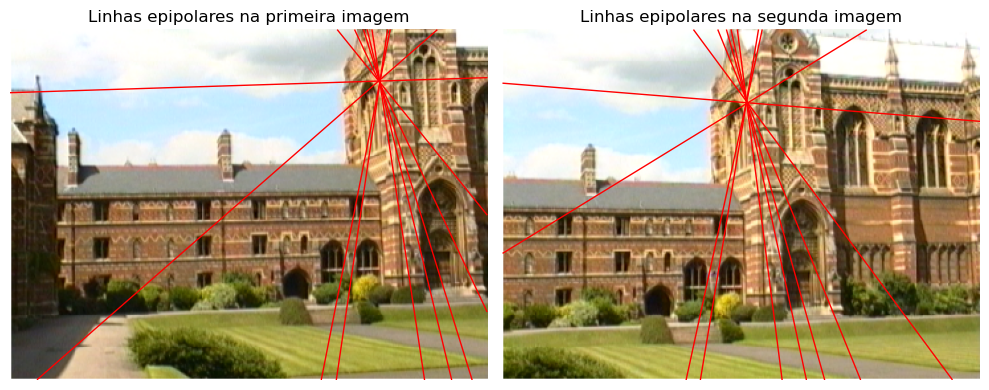

In [495]:
plot_epipolar_lines(keble000_rgb, keble003_rgb, keble000_kpts, keble003_kpts, F3)

##### Imagens bt000.png e bt006.png

##### Carregando as imagens e obtendo as correspondências utilizando o detector SIFT

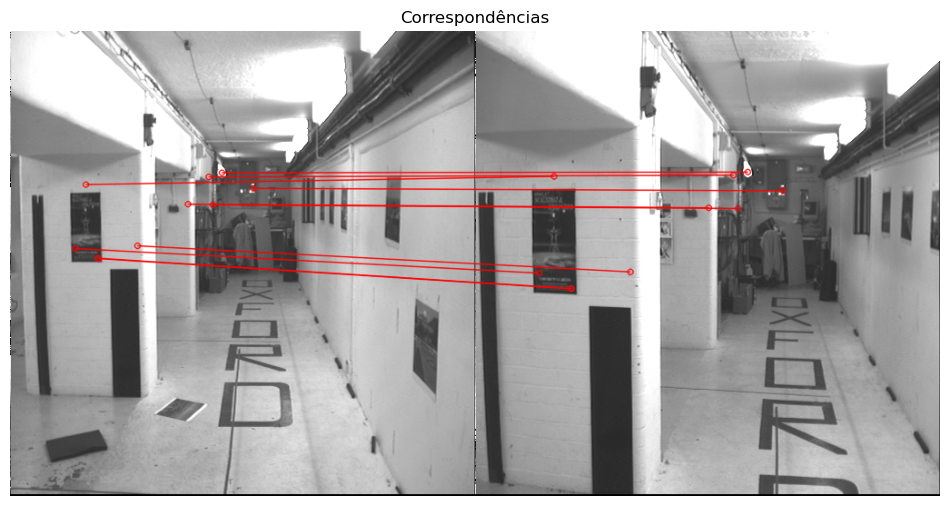

In [499]:
bt000 = cv2.imread('Imagens//bt000.png', cv2.IMREAD_GRAYSCALE) # Carrega as imagens
bt006 = cv2.imread('Imagens//bt006.png', cv2.IMREAD_GRAYSCALE)

bt000_rgb = plt.imread('Imagens//bt000.png') # Carrega as imagens em RGB
bt006_rgb = plt.imread('Imagens//bt006.png')

sift = cv2.SIFT_create() # Inicia o detector SIFT

# Encontra os keypoints e descritores
keypoint1, descriptors1 = sift.detectAndCompute(bt000, None)
keypoint2, descriptors2 = sift.detectAndCompute(bt006, None)

# Configura o FLANN matcher
index_params  = dict(algorithm=0, trees=20)
search_params = dict(checks=150)
flann = cv2.FlannBasedMatcher(index_params, search_params)

# Encontra as correspondências usando KNN
matches = flann.knnMatch(descriptors1, descriptors2, k=2)

# Aplica o Ratio Test
ratio = 0.21
best_matches = []
for m, n in matches:
    if m.distance < ratio * n.distance:
        best_matches.append(m)

# Visualiza as correspondências
matched_image = cv2.drawMatches(bt000, keypoint1, bt006, keypoint2, best_matches, None,
                                 matchColor=(255, 0 , 0), singlePointColor=(0, 255, 0), flags=2)

plt.figure(figsize=(12, 10))
plt.imshow(matched_image)
plt.title("Correspondências")
plt.axis("off")
plt.show()

# Extrai as coordenadas dos pontos correspondentes
bt000_kpts = np.array([keypoint1[m.queryIdx].pt for m in best_matches])  # Pontos na imagem 1
bt006_kpts = np.array([keypoint2[m.trainIdx].pt for m in best_matches])  # Pontos correspondentes na imagem 2

##### Obtendo a matriz fundamental 

In [657]:
F4 = normalized_8_point_algorithm(bt000_kpts, bt006_kpts, False)
F4 = F4 / F4[-1,-1]

print("")
print("Matriz Fundamental F:")
print(F4)


Matriz Fundamental F:
[[ 4.05285466e-06  2.85824948e-05 -3.59440957e-03]
 [-2.32218427e-05  8.89115036e-06  3.79561597e-03]
 [ 2.48218786e-04 -1.00376781e-02  1.00000000e+00]]


##### Plotando as linhas epipolares

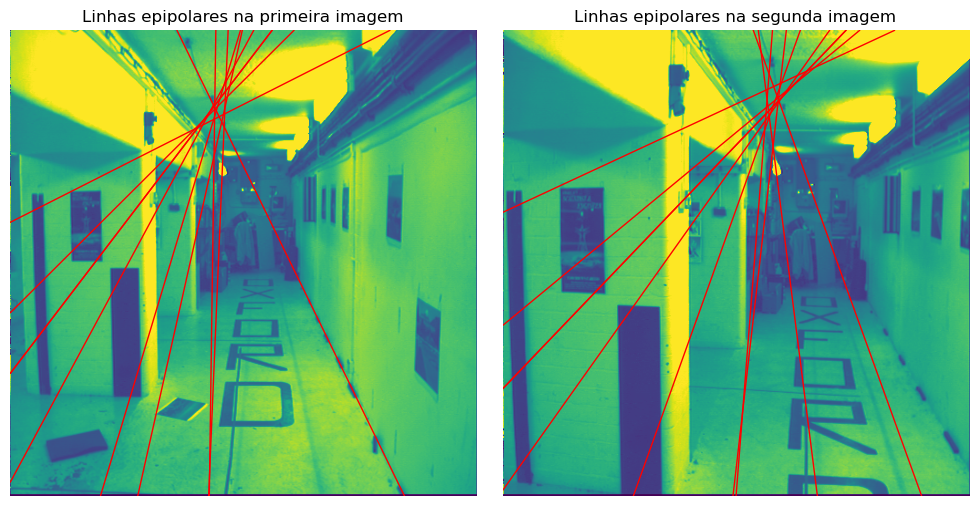

In [505]:
plot_epipolar_lines(bt000_rgb, bt006_rgb, bt000_kpts, bt006_kpts, F4)

##### 2 - Forçando a condição de posto 2 para as mesmas correspondências encontradas no item anterior

##### Imagens ex_12_F_eins.jpg e ex_12_F_zwei.jpg

##### Obtendo a matriz fundamental 

In [655]:
F5 = normalized_8_point_algorithm(ex_12_F_eins_kpts, ex_12_F_zwei_kpts, True)
F5 = F5 / F5[-1,-1]

print("")
print("Matriz Fundamental F:")
print(F5)


Matriz Fundamental F:
[[ 6.07594358e-06 -2.15687912e-04  4.56203687e-02]
 [ 1.33831531e-04  5.09524758e-05 -4.86204853e-01]
 [-4.22521356e-02  4.75024350e-01  1.00000000e+00]]


##### Plotando as linhas epipolares

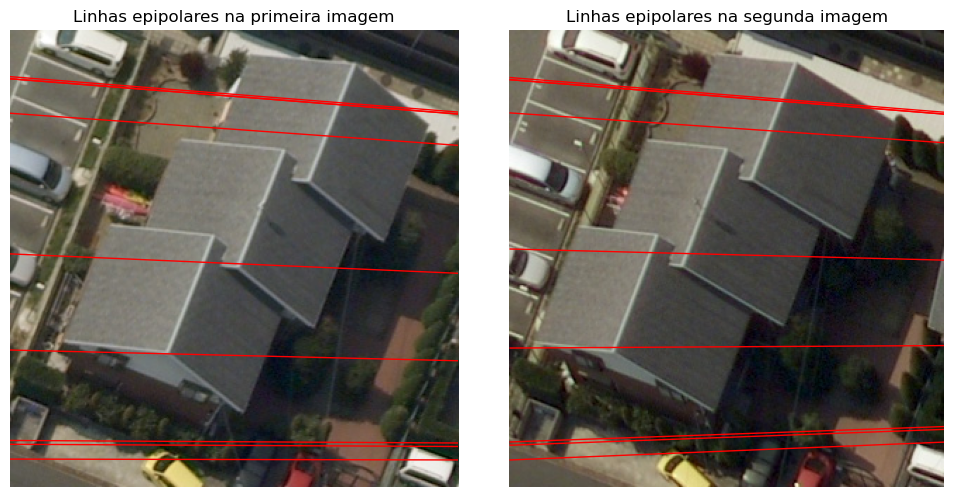

In [513]:
plot_epipolar_lines(ex_12_F_eins_rgb, ex_12_F_zwei_rgb, ex_12_F_eins_kpts, ex_12_F_zwei_kpts, F5)

##### Imagens chapel00.png e chapel01.png

##### Obtendo a matriz fundamental 

In [653]:
F6 = normalized_8_point_algorithm(chapel00_kpts, chapel01_kpts, True)
F6 = F6 / F6[-1,-1]

print("")
print("Matriz Fundamental F:")
print(F6)


Matriz Fundamental F:
[[-2.52299361e-06 -1.42142706e-04  1.43249374e-02]
 [ 9.25291395e-05  1.56756449e-05 -3.74405450e-01]
 [-3.05448281e-03  3.90592705e-01  1.00000000e+00]]


##### Plotando as linhas epipolares

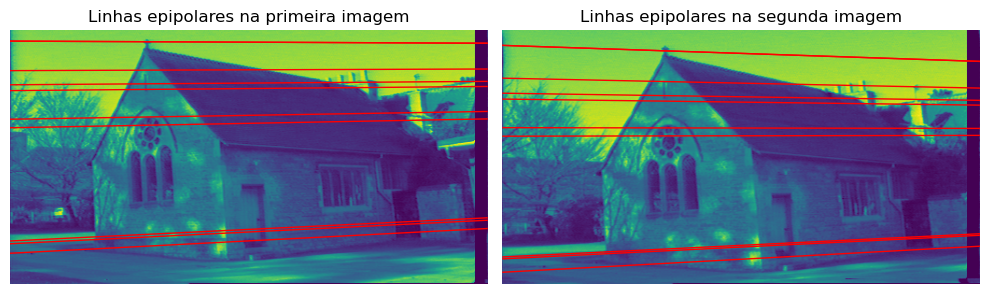

In [520]:
plot_epipolar_lines(chapel00_rgb, chapel01_rgb, chapel00_kpts, chapel01_kpts, F6)

##### Imagens keble000.png e keble003.png

##### Obtendo a matriz fundamental 

In [651]:
F7 = normalized_8_point_algorithm(keble000_kpts, keble003_kpts, True)
F7 = F7 / F7[-1,-1]

print("")
print("Matriz Fundamental F:")
print(F7)


Matriz Fundamental F:
[[-1.41193080e-05 -2.23862097e-04  1.27254470e-02]
 [ 2.21728803e-04 -4.22849855e-06 -6.17485090e-02]
 [-9.39738196e-03  4.13953779e-02  1.00000000e+00]]


##### Plotando as linhas epipolares

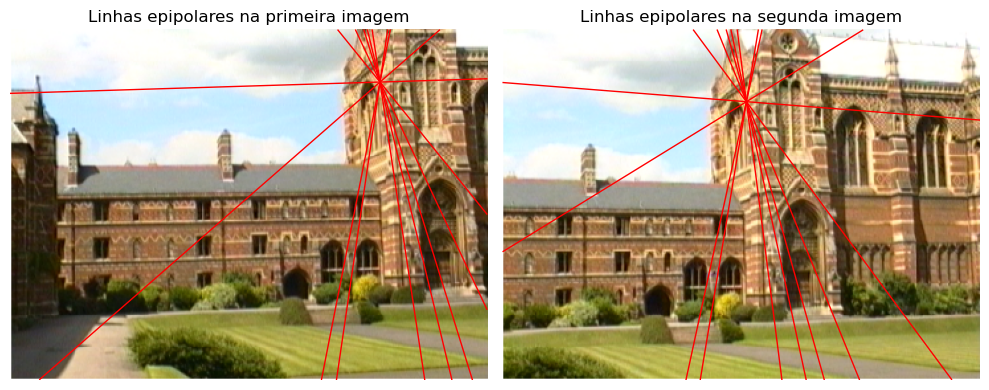

In [527]:
plot_epipolar_lines(keble000_rgb, keble003_rgb, keble000_kpts, keble003_kpts, F7)

##### Imagens bt000.png e bt006.png

##### Obtendo a matriz fundamental 

In [646]:
F8 = normalized_8_point_algorithm(bt000_kpts, bt006_kpts, True)
F8 = F8 / F8[-1,-1]

print("")
print("Matriz Fundamental F:")
print(F8)


Matriz Fundamental F:
[[ 4.07938786e-06  2.93376000e-05 -3.75197109e-03]
 [-2.39769300e-05  9.08746541e-06  3.86937103e-03]
 [ 2.02071501e-04 -1.03850921e-02  1.00000000e+00]]


##### Plotando as linhas epipolares

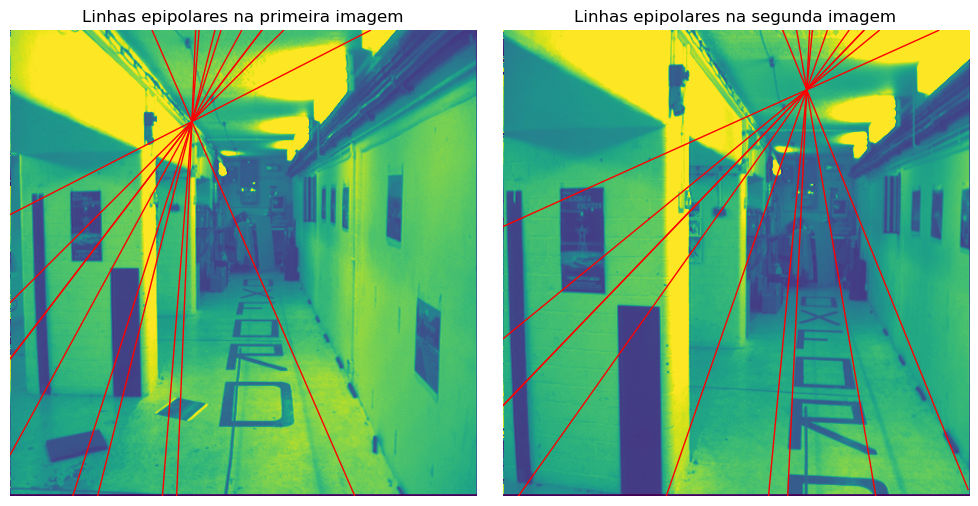

In [649]:
plot_epipolar_lines(bt000_rgb, bt006_rgb, bt000_kpts, bt006_kpts, F8)

##### 3 - A condição de posto 2, garante que a matriz fundamental calculada reflita a geometria epipolar entre as duas imagens, sem esta condição o algoritmo de 8 pontos normalizados pode fornecer uma matriz incorreta o que leva a linhas epipolares que não se encontram no epipolo, embora seja difícil visualizar este resultado nas imagens geradas devido a matriz calculada sem esta condição já estar bem próxima do valor exato (Último valor singular bem menor que os outros 2 e próximo de zero), com um olhar mais atento nota-se que as retas estão mais alinhados no ponto de encontro na imagem bt000.png para a condição de posto 2.

#### Item V - Cálculo da matriz fundamental F dos pares de imagens utilizando o algoritmo de 7 pontos

##### Imagens ex_12_F_eins.jpg e ex_12_F_zwei.jpg

##### Cálculo das matrizes fundamentais e plot das suas respectivas linhas epipolares 


Matriz fundamental F0
 [[-3.75293339e-06 -7.73572292e-05 -1.06100787e-02]
 [ 4.09541699e-05  2.71781701e-05 -2.54827484e-01]
 [ 1.71307997e-02  2.48548930e-01  1.00000000e+00]]


Linhas epipolares da matriz fundamental F0


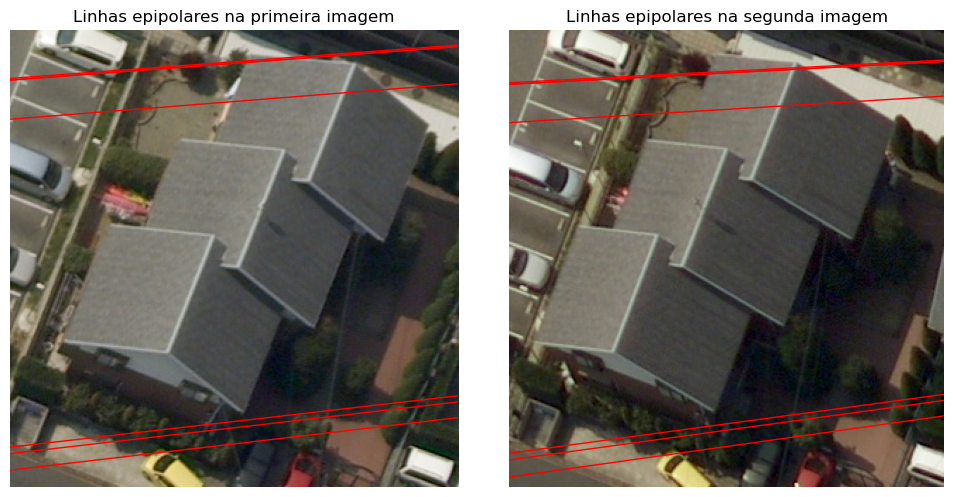

In [676]:
Fs1 = seven_point_algorithm(ex_12_F_eins_kpts[0:7],ex_12_F_zwei_kpts[0:7])

for i in range(Fs1.shape[0]):
    print("")
    print(f"Matriz fundamental F{i}\n",Fs1[i])

print("")
for i in range(Fs1.shape[0]):
    print("")
    print(f"Linhas epipolares da matriz fundamental F{i}")
    plot_epipolar_lines(ex_12_F_eins_rgb, ex_12_F_zwei_rgb, ex_12_F_eins_kpts[0:7], ex_12_F_zwei_kpts[0:7], Fs1[i])

##### Imagens chapel00.png e chapel01.png

##### Cálculo das matrizes fundamentais e plot das suas respectivas linhas epipolares 


Matriz fundamental F0
 [[ 4.92271818e-05  2.78141896e-03 -1.76870445e-01]
 [-3.42367166e-03  1.02744332e-05 -5.76612112e-01]
 [ 2.46493235e-01  6.07880846e-01  1.00000000e+00]]

Matriz fundamental F1
 [[ 2.75192595e-05 -1.55041980e-04  2.34196563e-02]
 [ 1.81603320e-04 -3.49716001e-07 -1.93112209e-02]
 [-3.98413948e-02  1.91172703e-02  1.00000000e+00]]

Matriz fundamental F2
 [[ 2.78805071e-05 -1.06175508e-04  2.00865724e-02]
 [ 1.21606926e-04 -1.72916549e-07 -2.85854216e-02]
 [-3.50764198e-02  2.89150504e-02  1.00000000e+00]]


Linhas epipolares da matriz fundamental F0


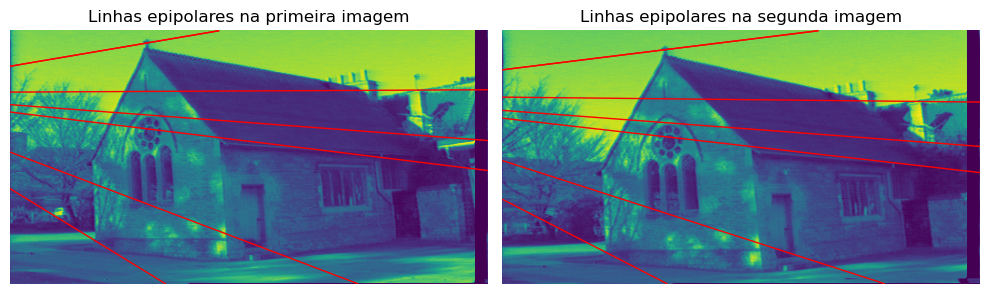


Linhas epipolares da matriz fundamental F1


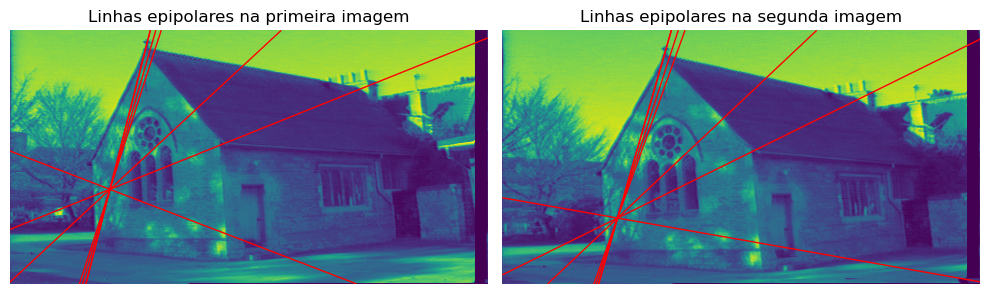


Linhas epipolares da matriz fundamental F2


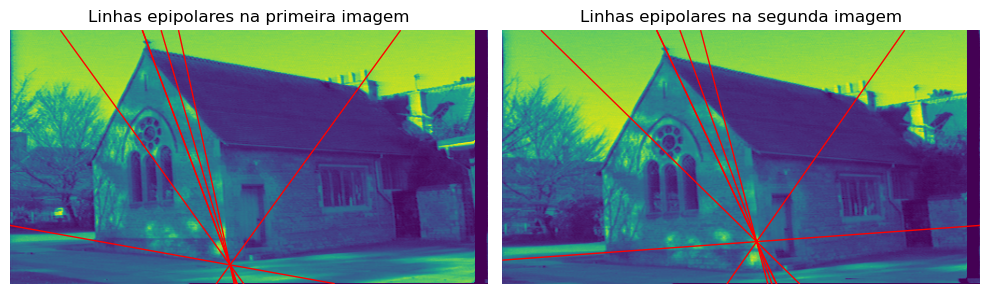

In [678]:
Fs2 = seven_point_algorithm(chapel00_kpts[0:7], chapel01_kpts[0:7])

for i in range(Fs2.shape[0]):
    print("")
    print(f"Matriz fundamental F{i}\n",Fs2[i])

print("")
for i in range(Fs2.shape[0]):
    print("")
    print(f"Linhas epipolares da matriz fundamental F{i}")
    plot_epipolar_lines(chapel00_rgb, chapel01_rgb, chapel00_kpts[0:7], chapel01_kpts[0:7], Fs2[i])

##### Imagens keble000.png e keble003.png

##### Cálculo das matrizes fundamentais e plot das suas respectivas linhas epipolares 


Matriz fundamental F0
 [[ 2.35075304e-05  1.49960160e-04 -1.85308300e-03]
 [-1.48366133e-04  3.26610568e-06  3.91529926e-02]
 [-6.59560488e-03 -2.54696047e-02  1.00000000e+00]]

Matriz fundamental F1
 [[ 4.46567235e-06 -4.51395092e-05  5.31378805e-03]
 [ 4.47137554e-05 -5.35864793e-07 -1.33073108e-02]
 [-7.87629179e-03  9.21684355e-03  1.00000000e+00]]

Matriz fundamental F2
 [[-4.19195343e-06 -1.33844084e-04  8.57229819e-03]
 [ 1.32500011e-04 -2.26447959e-06 -3.71590628e-02]
 [-8.45857256e-03  2.49874836e-02  1.00000000e+00]]


Linhas epipolares da matriz fundamental F0


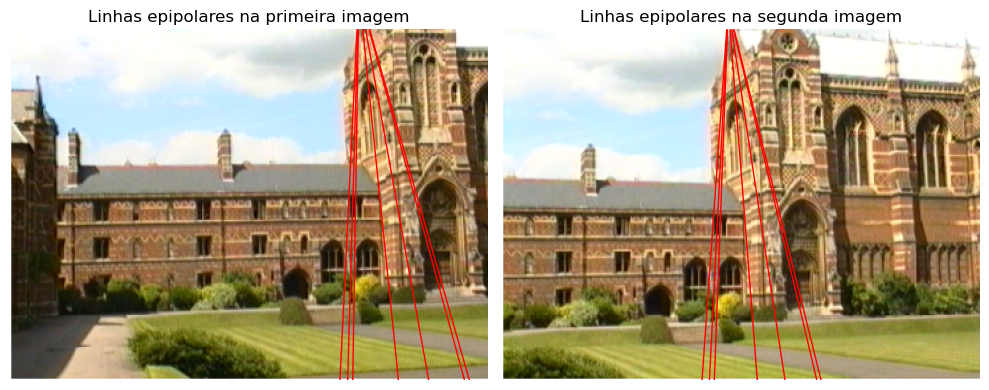


Linhas epipolares da matriz fundamental F1


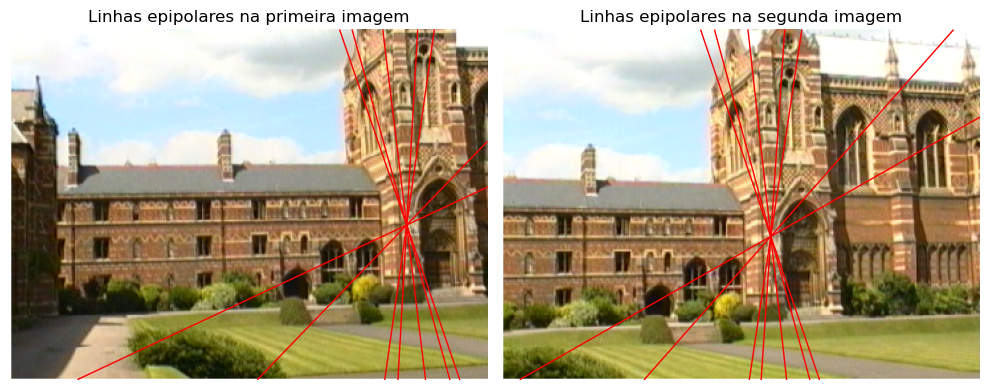


Linhas epipolares da matriz fundamental F2


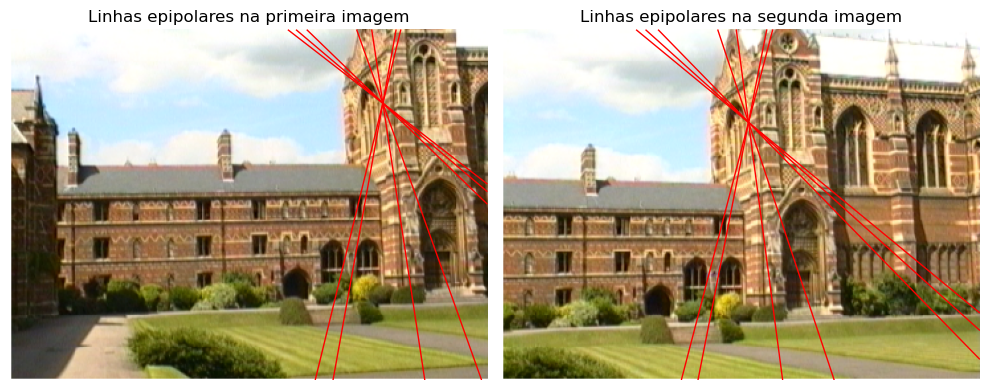

In [680]:
Fs3 = seven_point_algorithm(keble000_kpts[0:7],keble003_kpts[0:7])

for i in range(Fs3.shape[0]):
    print("")
    print(f"Matriz fundamental F{i}\n",Fs3[i])

print("")
for i in range(Fs3.shape[0]):
    print("")
    print(f"Linhas epipolares da matriz fundamental F{i}")
    plot_epipolar_lines(keble000_rgb, keble003_rgb, keble000_kpts[0:7], keble003_kpts[0:7], Fs3[i])

##### Imagens bt000.png e bt006.png

##### Cálculo das matrizes fundamentais e plot das suas respectivas linhas epipolares 


Matriz fundamental F0
 [[ 6.30712812e-06  2.81305605e-05 -4.79608624e-03]
 [-2.01374404e-05  9.63563418e-06  2.57417449e-03]
 [ 7.67005980e-04 -8.93939251e-03  1.00000000e+00]]

Matriz fundamental F1
 [[ 1.06567719e-05  3.51603140e-05 -9.35523754e-03]
 [-2.23359803e-05  1.04212114e-05  1.61933165e-03]
 [ 4.44219612e-03 -8.25450266e-03  1.00000000e+00]]

Matriz fundamental F2
 [[ 2.42573383e-04  4.09976436e-04 -2.52442480e-01]
 [-1.39558896e-04  5.23070354e-05 -4.92914843e-02]
 [ 2.00397930e-01  2.82628170e-02  1.00000000e+00]]


Linhas epipolares da matriz fundamental F0


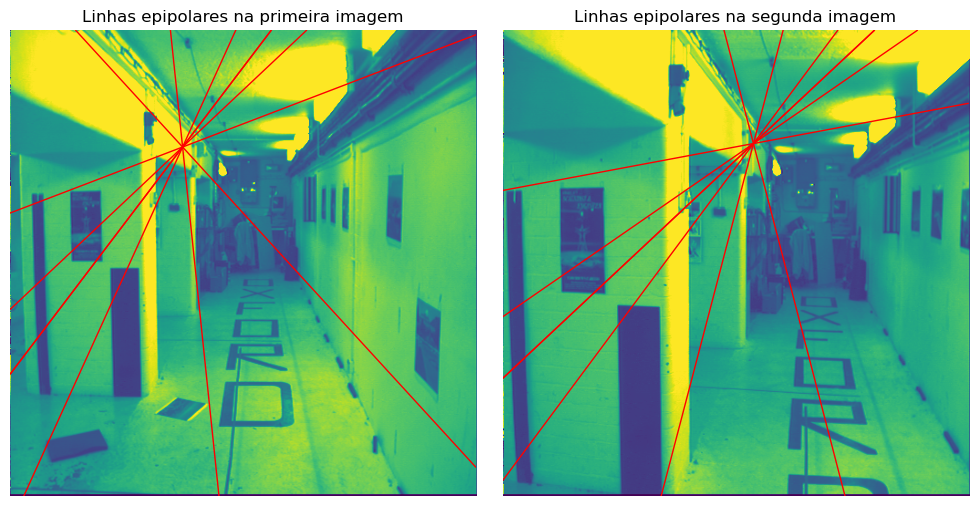


Linhas epipolares da matriz fundamental F1


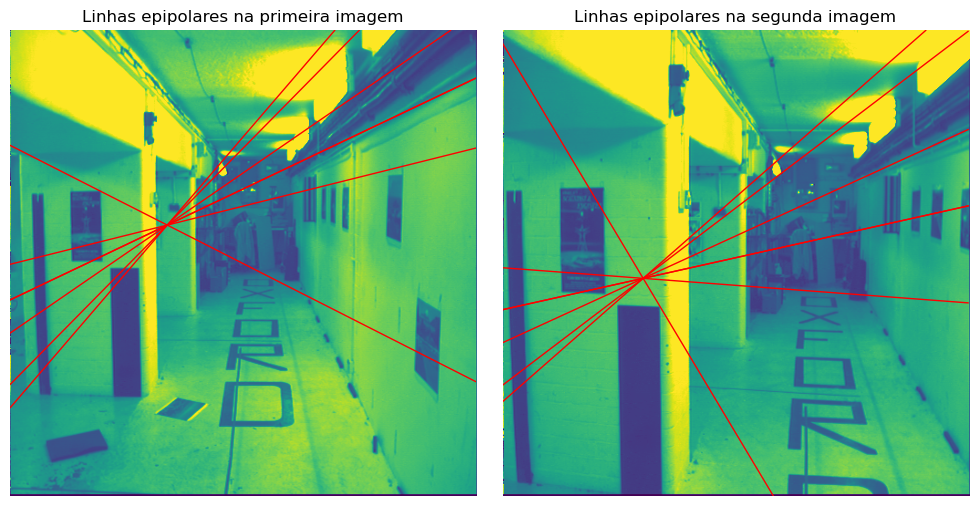


Linhas epipolares da matriz fundamental F2


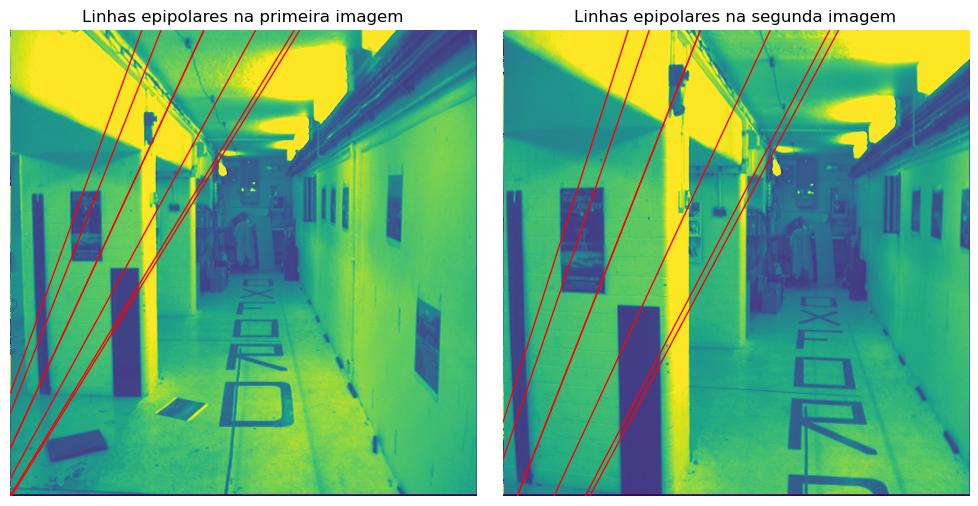

In [682]:
Fs4 = seven_point_algorithm(bt000_kpts[0:7],bt006_kpts[0:7])

for i in range(Fs4.shape[0]):
    print("")
    print(f"Matriz fundamental F{i}\n",Fs4[i])

print("")
for i in range(Fs4.shape[0]):
    print("")
    print(f"Linhas epipolares da matriz fundamental F{i}")
    plot_epipolar_lines(bt000_rgb, bt006_rgb, bt000_kpts[0:7], bt006_kpts[0:7], Fs4[i])

#### Item VI - Cálculo da matriz fundamental F e plot das linhas epipolares da par de imagens kronan1.jpg e kronan2.jpg

Matriz Fundamental: 
 [[-3.60131498e-08 -3.81244233e-06  5.80779104e-03]
 [ 4.74987631e-06  2.78787990e-07 -2.63845753e-02]
 [-7.18260292e-03  2.60085932e-02  1.00000000e+00]]



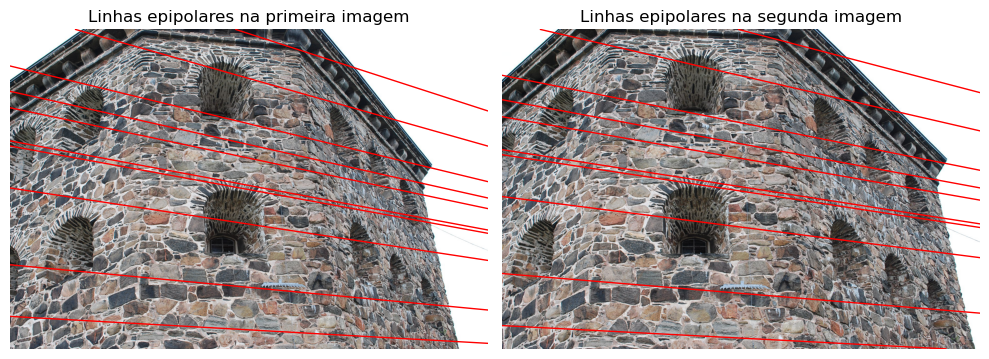

In [693]:
# Carregando os dados
data = sio.loadmat('Arquivos//kronandata.mat')
points = data['x']  
kronan1_pts = points[0, 0][:2,:].T
kronan2_pts = points[1, 0][:2,:].T

# Carregando as imagens em escala de cinza
kronan1 = cv2.imread('Imagens//kronan1.jpg', cv2.IMREAD_GRAYSCALE)
kronan2 = cv2.imread('Imagens//kronan2.jpg', cv2.IMREAD_GRAYSCALE)

# Calculando a matriz fundamental F
F_kronan = normalized_8_point_algorithm(kronan1_pts, kronan2_pts, True)
F_kronan = F_kronan / F_kronan[-1,-1]
print("Matriz Fundamental: \n",F_kronan)

# Obtendo 10 amostras aleatórias de retas epipolares 
random_index = np.random.randint(len(kronan1_pts), size=(10))

kronan1_rgb = plt.imread('Imagens//kronan1.jpg')
kronan2_rgb = plt.imread('Imagens//kronan2.jpg')

print("")
# Plotando as 10 linhas epipolares 
plot_epipolar_lines(kronan1_rgb, kronan2_rgb, kronan1_pts[random_index], kronan2_pts[random_index], F_kronan)

#### Item VII - Imagens mesaTrabalho

##### Carregando os dados

In [695]:
data   = sio.loadmat('Arquivos//pontos_mesa_de_trabalho.mat')
points = np.array([data['ptsIm1'].T, data['ptsIm2'].T])

mesaTrabalho_esquerda_pts = points[0]
mesaTrabalho_direita_pts  = points[1]

##### 1 - Plot das imagens com os pontos correspondentes.

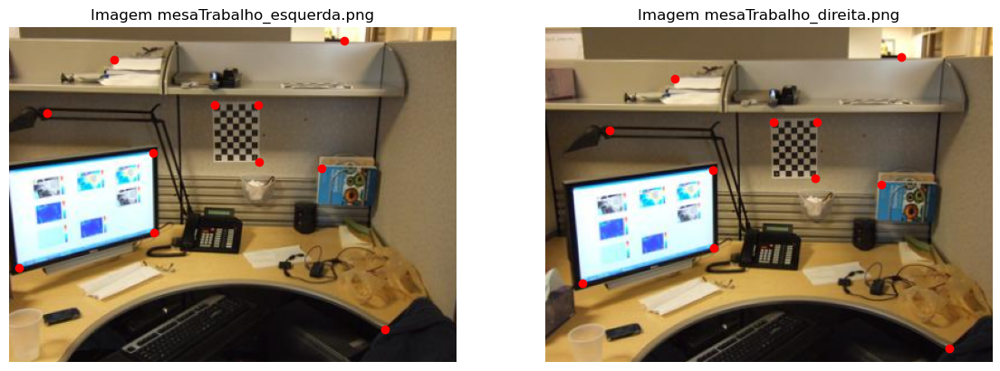

In [698]:
mesaTrabalho_esquerda = plt.imread('Imagens//mesaTrabalho_esquerda.png')
mesaTrabalho_direita  = plt.imread('Imagens//mesaTrabalho_direita.png')

plt.figure(figsize=(14,14))
plt.subplot(1,2,1)
plt.imshow(mesaTrabalho_esquerda)
plt.scatter(mesaTrabalho_esquerda_pts[:,0], mesaTrabalho_esquerda_pts[:,1], color='red')
plt.title('Imagem mesaTrabalho_esquerda.png')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(mesaTrabalho_direita)
plt.scatter(mesaTrabalho_direita_pts[:,0], mesaTrabalho_direita_pts[:,1], color='red')
plt.title('Imagem mesaTrabalho_direita.png')
plt.axis('off')

plt.show()

##### 2 - Normalizando os pontos

In [700]:
_, T     = normalize_image_points(mesaTrabalho_esquerda_pts[:,:2])
_, T_lin = normalize_image_points(mesaTrabalho_direita_pts[:,:2])

print("Matrizes de similaridade que normalizam os pontos")
print("T: \n",T)
print("")
print("T_linha: \n",T_lin)

Matrizes de similaridade que normalizam os pontos
T: 
 [[0.00297451 0.         0.52380283]
 [0.         0.00370288 0.43174244]
 [0.         0.         1.        ]]

T_linha: 
 [[0.00276924 0.         0.5474635 ]
 [0.         0.00347596 0.45788238]
 [0.         0.         1.        ]]


##### 3 - Cálculo das matrizes fundamentais utilizando o Algoritmo dos 8 Pontos Normalizados 

In [704]:
# Cálculo da matriz F usando os 8 primeiros pontos de cada imagem
Fmesa = normalized_8_point_algorithm(mesaTrabalho_esquerda_pts[:8,:2], mesaTrabalho_direita_pts[:8,:2], True)
Fmesa = Fmesa / Fmesa[-1,-1]

print("Matriz Fundamental calculada \n")
print(Fmesa)

Matriz Fundamental calculada 

[[ 4.75162426e-06 -3.64345581e-04  3.51531741e-02]
 [ 3.67927103e-04  3.40231791e-06 -9.46822096e-02]
 [-4.29529385e-02  1.00311828e-01  1.00000000e+00]]


##### 4 - Plot das linhas epipolares da martriz fundamental caluclado no item anterior para os 8 primeiros pontos

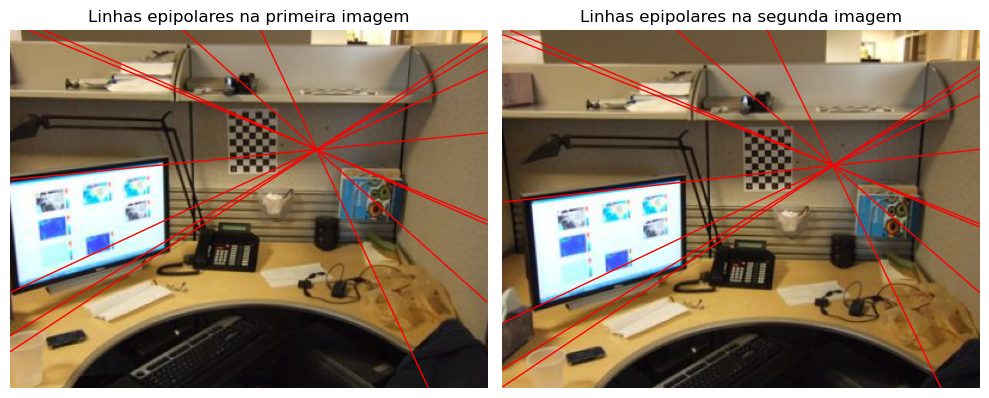

In [707]:
plot_epipolar_lines(mesaTrabalho_esquerda, mesaTrabalho_direita, mesaTrabalho_esquerda_pts[:8,:2], mesaTrabalho_direita_pts[:8,:2], Fmesa)

##### É possível observar que o epipolo apresenta linhas epipolares radiais além de estar na mesma região nas duas imagens, isso significa que as duas câmeras estão com os seus centros na mesma direção com uma câmera deslocada em relação a outra mas apontando pra mesma direção, o movimento relativo entre as duas foi em maior parte devido a uma translação pura, a câmera da direita está mais próxima.

##### 5 - Cálculo e plot da posição do epipolo em cada imagem

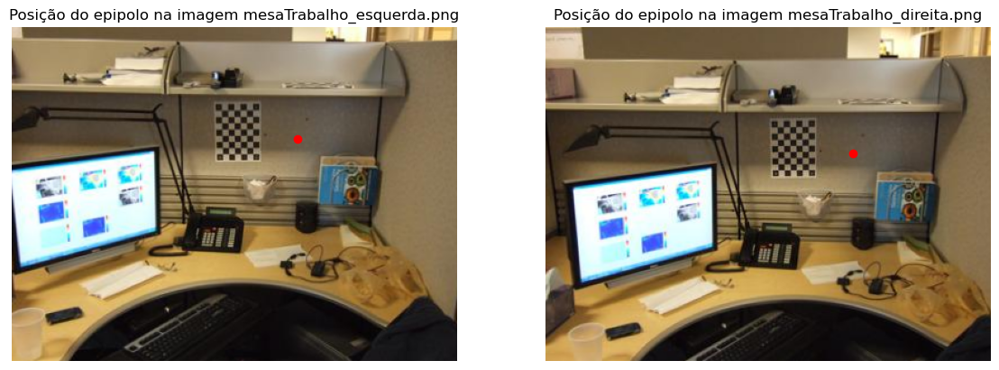

In [711]:
_, _, Vt_1 = linalg.svd(Fmesa)
_, _, Vt_2 = linalg.svd(Fmesa.T)

e     = Vt_1[-1] / Vt_1[-1,-1]
e_lin = Vt_2[-1] / Vt_2[-1,-1]

plt.figure(figsize=(14,14))
plt.subplot(1,2,1)
plt.imshow(mesaTrabalho_esquerda)
plt.scatter(e[0], e[1], color='red')
plt.title('Posição do epipolo na imagem mesaTrabalho_esquerda.png')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(mesaTrabalho_direita)
plt.scatter(e_lin[0], e_lin[1], color='red')
plt.title('Posição do epipolo na imagem mesaTrabalho_direita.png')
plt.axis('off')

plt.show()

##### 6 - Cálculo da matriz fundamental utilizando o algoritmo Gold Standard

In [713]:
pts1  = mesaTrabalho_esquerda_pts[:,:2]
pts2  = mesaTrabalho_direita_pts[:,:2]
F_opt = gold_standard_algorithm(pts1, pts2)

print("Matriz Fundamental F: \n")
print(F_opt)

Matriz Fundamental F: 

[[-5.79113393e-06  8.18924550e-04 -8.39216857e-02]
 [-8.08608284e-04  3.53577619e-06  6.39503698e-02]
 [ 9.64219168e-02 -8.41336183e-02  1.00000000e+00]]


##### 7 - Plot das linhas epipolares da matriz calculada no item anterior

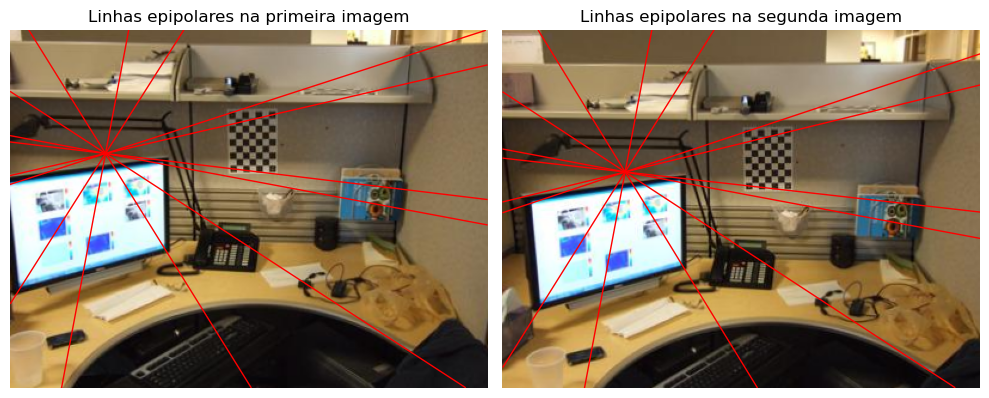

In [716]:
plot_epipolar_lines(mesaTrabalho_esquerda, mesaTrabalho_direita, mesaTrabalho_esquerda_pts[:8,:2], mesaTrabalho_direita_pts[:8,:2], F_opt)

##### Com o algoritmo gold standard obtemos uma matriz fundamental mais precisa, onde, ao plotar as linhas epipolares é possível ver a posição do epipolo que representa melhor o ponto de fuga na direção do movimento de translação entre as duas câmeras. 

##### 8 - Calculo e plot do epipolo pra matriz calculada pelo algoritmo Gold Standard

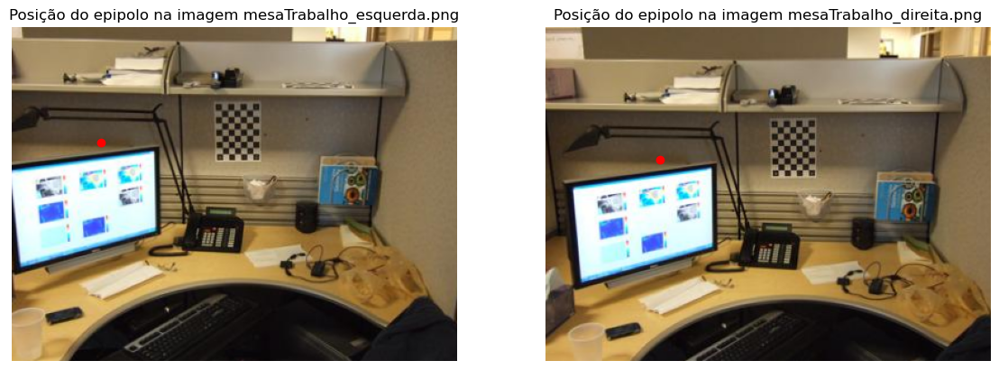

In [720]:
_, _, Vt_1 = linalg.svd(F_opt)
_, _, Vt_2 = linalg.svd(F_opt.T)

e_gs     = Vt_1[-1] / Vt_1[-1,-1]
e_lin_gs = Vt_2[-1] / Vt_2[-1,-1]

plt.figure(figsize=(14,14))
plt.subplot(1,2,1)
plt.imshow(mesaTrabalho_esquerda)
plt.scatter(e_gs[0], e_gs[1], color='red')
plt.title('Posição do epipolo na imagem mesaTrabalho_esquerda.png')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(mesaTrabalho_direita)
plt.scatter(e_lin_gs[0], e_lin_gs[1], color='red')
plt.title('Posição do epipolo na imagem mesaTrabalho_direita.png')
plt.axis('off')

plt.show()

#### Item VIII - Reconstrução 3D da esfera a apartir do arquivo data_sphere.mat

##### Carregando os dados

In [724]:
# Carregar o arquivo .mat usando h5py
with h5py.File('Arquivos/data_sphere.mat', 'r') as mat_file:
    points3d_synthetic = np.array(mat_file['points3d_synthetic']).T

# Matrizes de calibração
calib_synthetic = np.zeros((3, 3, 2))
calib_synthetic[:, :, 0] = np.array([[6, 0, 7],
                                     [0, 8, 9],
                                     [0, 0, 1]])
calib_synthetic[:, :, 1] = np.array([[5, 0, 3],
                                     [0, 5, 2],
                                     [0, 0, 1]])

# Rotação e translação
R1 = np.eye(3)
t1 = np.zeros((3, 1))
R2 = get_rotation_matrix([np.deg2rad(10), np.deg2rad(20), np.deg2rad(30)])
t2 = np.array([0.1, 0.2, 0.3]).reshape(3, 1)

# Projeção para imagem 1
P1 = calib_synthetic[:, :, 0] @ np.hstack((R1, t1))
points2d_synthetic = np.zeros((3, points3d_synthetic.shape[1], 2))
points2d_synthetic[:, :, 0] = P1 @ points3d_synthetic
points2d_synthetic[:, :, 0] /= points2d_synthetic[2, :, 0]

# Projeção para imagem 2
P2 = calib_synthetic[:, :, 1] @ np.hstack((R2, t2))
points2d_synthetic[:, :, 1] = P2 @ points3d_synthetic
points2d_synthetic[:, :, 1] /= points2d_synthetic[2, :, 1]

# Preparar os resultados
pts2d_1 = np.array((points2d_synthetic[:,:,0].T)[:,:2])
pts2d_2 = np.array((points2d_synthetic[:,:,1].T)[:,:2])
K1 = calib_synthetic[:, :, 0]
K2 = calib_synthetic[:, :, 1]

##### 1 - Cálculo da matriz fundamental F

In [727]:
F_sphere = gold_standard_algorithm(pts2d_1, pts2d_2)

print("Matriz Fundamental F: \n")
print(F_sphere)

Matriz Fundamental F: 

[[ 0.04978787  0.0094577  -0.56159927]
 [-0.06831774  0.00378372  0.3991014 ]
 [ 0.03758038 -0.0571028   1.        ]]


##### 2 - Cálculo da matriz essencial E

In [1396]:
E_sphere, _ = cv2.findEssentialMat(pts2d_1, pts2d_2)

print("Matriz Essencial E: \n")
print(E_sphere)

Matriz Essencial E: 

[[-0.11470929 -0.08727047  0.60725458]
 [ 0.0989679   0.03579071 -0.31721942]
 [ 0.66963589 -0.19065033  0.11833834]]


##### 3. Calculo das matrizes de câmera para os dois conjuntos de pontos, a partir da matriz essencial.

In [1744]:
P_e1, P_e2 = find_camera_matrices(E_sphere, pts2d_1, pts2d_2, K1, K2)

print("Matriz P: \n")
print(P_e1)
print("")
print("Matriz P_linha: \n")
print(P_e2)

Matriz P: 

[[1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]]

Matriz P_linha: 

[[ 0.72902042 -0.68335105  0.03950411  0.47003728]
 [-0.64795434 -0.7075594  -0.28198379  0.88124482]
 [ 0.22064542  0.17997508 -0.95860553 -0.04972449]]


##### 4. Reconstrução dos pontos 3D

In [1747]:
X_ret = linear_triangulation(pts2d_1, pts2d_2, P_e1, P_e2)

##### 5. Obtendo novos pontos 2D

In [1750]:
pts2d_projetados1 = np.array(project_points(P_e1, X_ret))
pts2d_projetados2 = np.array(project_points(P_e2, X_ret))

##### 6. Plot dos resultados

###### Pontos 2D fornecidos

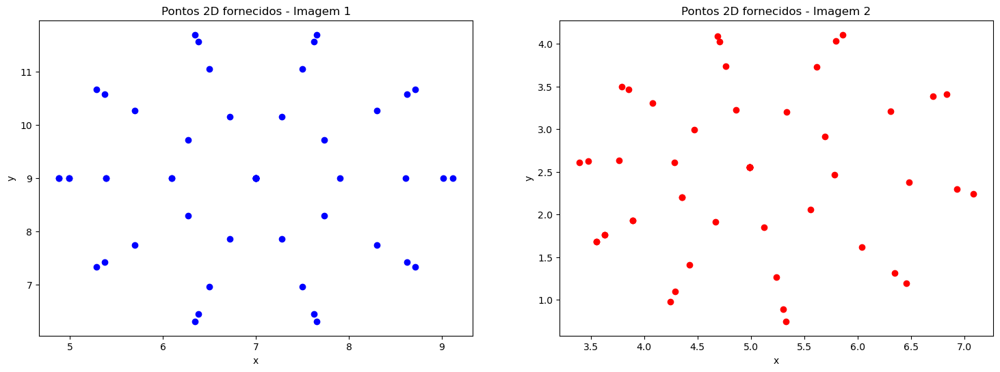

In [1754]:
fig, ax = plt.subplots(1, 2, figsize=(18, 6))

ax[0].scatter(pts2d_1[:,0], pts2d_1[:,1], color='blue')
ax[0].set_title('Pontos 2D fornecidos - Imagem 1')
ax[0].set_xlabel('x')
ax[0].set_ylabel('y')

ax[1].scatter(pts2d_2[:,0], pts2d_2[:,1], color='red')
ax[1].set_title('Pontos 2D fornecidos - Imagem 2')
ax[1].set_xlabel('x')
ax[1].set_ylabel('y')

plt.show()

###### Pontos 2D calculados

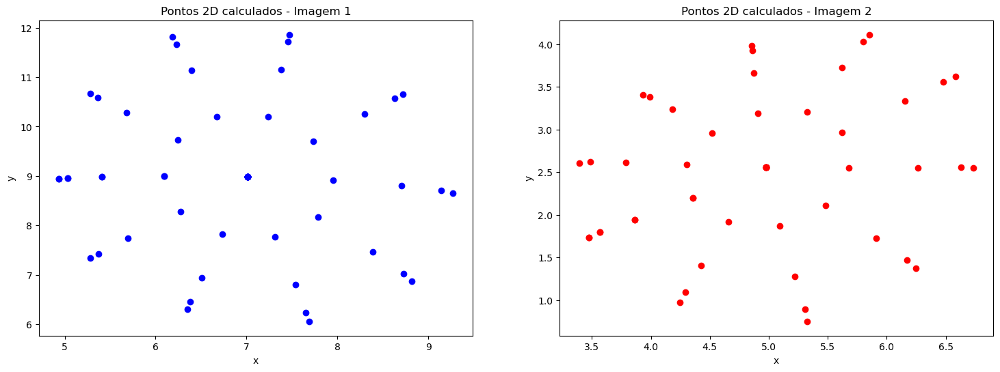

In [1757]:
fig, ax = plt.subplots(1, 2, figsize=(18, 6))

ax[0].scatter(pts2d_projetados1[:,0], pts2d_projetados1[:,1], color='blue')
ax[0].set_title('Pontos 2D calculados - Imagem 1')
ax[0].set_xlabel('x')
ax[0].set_ylabel('y')

ax[1].scatter(pts2d_projetados2[:,0], pts2d_projetados2[:,1], color='red')
ax[1].set_title('Pontos 2D calculados - Imagem 2')
ax[1].set_xlabel('x')
ax[1].set_ylabel('y')

plt.show()

###### Pontos 3D 

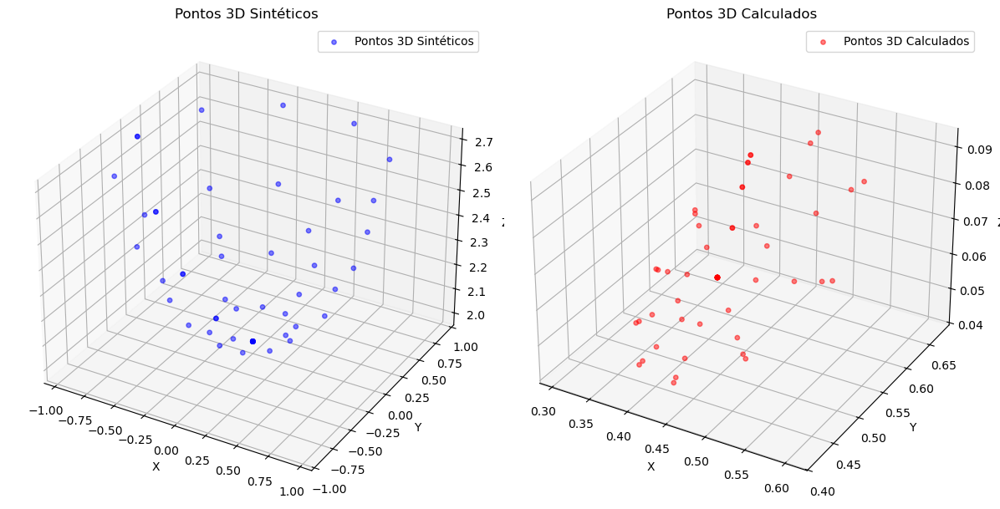

In [1760]:
fig = plt.figure(figsize=(12, 6))
ax1 = fig.add_subplot(121, projection='3d')  # Subgráfico à esquerda
ax1.scatter(points3d_synthetic[0], points3d_synthetic[1], points3d_synthetic[2], marker='o', s=15, c='blue', alpha=0.5, label='Pontos 3D Sintéticos')
ax1.set_xlabel('X')
ax1.set_ylabel('Y')
ax1.set_zlabel('Z')
ax1.legend()
ax1.set_title('Pontos 3D Sintéticos')

ax2 = fig.add_subplot(122, projection='3d')  # Subgráfico à direita
ax2.scatter(X_ret[:,0], X_ret[:,1], X_ret[:,2], marker='o', s=15, c='red', alpha=0.5, label='Pontos 3D Calculados')
ax2.set_xlabel('X')
ax2.set_ylabel('Y')
ax2.set_zlabel('Z')
ax2.legend()
ax2.set_title('Pontos 3D Calculados')

plt.tight_layout()
plt.show()

#### Apêndice

##### Funções utilizadas

In [1764]:
# Função que normaliza os pontos no espaço 3D para melhor condicionamento numérico
def normalize_points_3d(points):
    # Centróide dos pontos 3D
    centroid = np.array([np.mean(points[:, 0]), np.mean(points[:, 1]), np.mean(points[:, 2])])
    
    # Centraliza os pontos em relação ao centróide
    shifted_points = np.transpose(np.array([points[:, 0] - centroid[0], 
                                            points[:, 1] - centroid[1], 
                                            points[:, 2] - centroid[2]]))
    
    # Distância média dos pontos ao centróide
    avg_dist = 0
    number_pts = points.shape[0]
    for i in range(number_pts):
        avg_dist += np.sqrt((shifted_points[i, 0] ** 2 + shifted_points[i, 1] ** 2 + shifted_points[i, 2] ** 2))
    avg_dist /= number_pts
    
    # Fator de escala para normalizar os pontos
    scale = np.sqrt(3) / avg_dist
    
    # Matriz de transformação para normalização
    T = np.array([[scale, 0, 0, -scale * centroid[0]], 
                  [0, scale, 0, -scale * centroid[1]], 
                  [0, 0, scale, -scale * centroid[2]], 
                  [0, 0, 0, 1]])
    
    # Aplica a transformação
    n = points.shape[0]
    homogeneous_points = np.hstack((points, np.ones((n, 1))))
    normalized_points_homogeneous = (T @ homogeneous_points.T).T
    normalized_points = normalized_points_homogeneous[:, :3] 

    return normalized_points, T

# Função que normaliza os pontos no espaço 2D para melhor condicionamento numérico
def normalize_points(points):
    # Calcula o centróide dos pontos 2D
    centroid = np.array([np.mean(points[:, 0]), np.mean(points[:, 1])])
    
    # Centraliza os pontos em relação ao centróide
    shifted_points = np.transpose(np.array([points[:, 0] - centroid[0], points[:, 1] - centroid[1]]))
    
    # Distância média dos pontos ao centróide
    avg_dist = 0
    number_pts = points.shape[0]
    for i in range(number_pts):
        avg_dist += np.sqrt(shifted_points[i, 0] ** 2 + shifted_points[i, 1] ** 2)
    avg_dist /= number_pts
    
    # Fator de escala para normalizar os pontos
    scale = np.sqrt(2) / avg_dist
    
    # Matriz de transformação para normalização
    T = np.array([[scale, 0, -scale * centroid[0]], 
                  [0, scale, -scale * centroid[1]], 
                  [0, 0, 1]])
    
    # Aplica a transformação
    n = points.shape[0]
    homogeneous_points = np.hstack((points, np.ones((n, 1))))
    normalized_points_homogeneous = (T @ homogeneous_points.T).T
    normalized_points = normalized_points_homogeneous[:, :2]  

    return normalized_points, T

# Função que normaliza pontos de imagens para um melhor condicionamento numérico
def normalize_image_points(points):
    # Calcula o centróide dos pontos 2D
    centroid = np.array([np.mean(points[:, 0]), np.mean(points[:, 1])])
    
    # Centraliza os pontos em relação ao centróide
    shifted_points = np.transpose(np.array([points[:, 0] - centroid[0], points[:, 1] - centroid[1]]))

    max_x = np.max(points[:, 0])
    max_y = np.max(points[:, 1])
    
    # Matriz de transformação para normalização
    T = np.array([[1 / max_x, 0, centroid[0] / max_x], 
                  [0, 1 / max_y, centroid[1] / max_y], 
                  [0, 0, 1]])
    
    # Aplica a transformação
    n = points.shape[0]
    homogeneous_points = np.hstack((points, np.ones((n, 1))))
    normalized_points_homogeneous = (T @ homogeneous_points.T).T
    normalized_points = normalized_points_homogeneous[:, :2]  

    return normalized_points, T

# Função para obter a matriz de projeção da câmera
def find_projection_camera_matrix(pontos2D, pontos3D):
    
    n = pontos3D.shape[0]
    A = np.zeros((2 * n, 12))
    
    # Normaliza os pontos 2D e 3D
    cube_image_norm, T_img = normalize_points(pontos2D)
    cube_3d_norm, T_cube = normalize_points_3d(pontos3D)
    
    # Preenche a matriz A
    for i in range(n):
        X, Y, Z = cube_3d_norm[i]
        x, y = cube_image_norm[i]
        A[2 * i] = [X, Y, Z, 1, 0, 0, 0, 0, -x * X, -x * Y, -x * Z, -x]
        A[2 * i + 1] = [0, 0, 0, 0, X, Y, Z, 1, -y * X, -y * Y, -y * Z, -y]
    
    # Realiza SVD para encontrar a matriz da câmera P
    A = np.array(A)
    U, S, Vt = linalg.svd(A)
    P = Vt[-1].reshape(3, 4)
    
    # Desfaz a normalização para obter a matriz P final
    P = linalg.inv(T_img) @ P @ T_cube
    
    return P

# Função para obter os parâmetros da câmera dada uma matriz de projeção
def find_camera_matrices(E, pts1, pts2, K1, K2):

    # Matriz da primeira câmera
    P1 = np.eye(3,4)
    
    # Decomposição da matriz essencial 
    R1, R2, t = cv2.decomposeEssentialMat(E)

    # Testar todas as combinações de R e t
    candidates = [
        (R1, t),
        (R1, -t),
        (R2, t),
        (R2, -t) ]
    
    for R, t_candidate in candidates:
        # Matriz de segunda câmera
        P2_candidate = np.hstack((R, t_candidate.reshape(3, 1)))  

        # Triangular o ponto 3D
        X_hat = linear_triangulation(pts1[:1,:], pts2[:1,:], P1, P2_candidate).T  # Triangular o primeiro ponto

        # Verificar se os pontos estão na frente das duas câmeras 
        point_cam1 = P1 @ X_hat
        point_cam2 = P2_candidate @ X_hat

        if (point_cam1[2] > 0) and (point_cam2[2] > 0):
            return P1, P2_candidate

# Função para calcular os parâmetros das câmeras
def find_camera_parameters(camera_matrix):
    
    # Extrai a matriz M e o vetor t
    M = camera_matrix[:, :3]
    t = camera_matrix[:, 3]
    
    # Decomposição RQ
    K, R = linalg.rq(np.linalg.inv(M))
    
    # Corrige os sinais da matriz intrínseca K
    T = np.diag(np.sign(np.diag(K)))
    K = K @ T
    R = T @ R
    
    # Normaliza K para que o último elemento seja 1
    K /= K[2, 2]
    
    # Calcula o centro óptico da câmera (C_til)
    C_til = -linalg.inv(M) @ t
    
    # Calcula as distâncias focais a partir da matriz intrínseca
    f = [K[0, 0], K[1, 1]]

    return K, R, t, f, C_til

# Algoritmo de 8 pontos normalizado para cálculo da matriz fundamental de duas câmeras
def normalized_8_point_algorithm(image_pts1, image_pts2, enforce_constraint):
    n = image_pts1.shape[0]
    F = np.zeros((n, 9))
    
    image_pts1_norm, T_1 = normalize_image_points(image_pts1)
    image_pts2_norm, T_2 = normalize_image_points(image_pts2)
    
    for i in range(n):
        x, y         = image_pts1_norm[i]
        x_lin, y_lin = image_pts2_norm[i]
        F[i] = [x_lin*x, x_lin*y, x_lin, y_lin*x, y_lin*y, y_lin, x, y, 1]
    
    F = np.array(F)
    _, _, Vt = linalg.svd(F)
    F = Vt[-1].reshape(3,3)
    F = F / F[-1,-1]
    _, S, _ = linalg.svd(F)
    
    if enforce_constraint:
        U, S, Vt = linalg.svd(F)
        D = np.diag([S[0], S[1], 0])
        F = U @ D @ Vt
        
    F = T_2.T @ F @ T_1
        
    return F 

# Algoritmo de 7 pontos para cálculo da matriz fundamental de duas câmeras
def seven_point_algorithm(image_pts1, image_pts2):
    
    A = np.zeros((7, 9))

    image_pts1_norm, T_1 = normalize_image_points(image_pts1)
    image_pts2_norm, T_2 = normalize_image_points(image_pts2)

    for i in range(7):
        x1, y1 = image_pts1_norm[i]
        x2, y2 = image_pts2_norm[i]
        A[i] = [x2*x1, x2*y1, x2, y2*x1, y2*y1, y2, x1, y1, 1]

    # Obtendo F1 e F2
    _, _, Vt = linalg.svd(A)
    F1 = Vt[-1].reshape(3, 3)  # Última linha de Vt
    F2 = Vt[-2].reshape(3, 3)  # Penúltima linha de Vt
    
    # Determinante da combinação linear F = α * F1 + (1-α) * F2
    def det(alpha):
        return np.linalg.det(alpha * F1 + (1 - alpha) * F2)
    
    # Obtendo os coeficientes da expressão det(F) = c3*alpha^3 + c2*alpha^2 + c1*alpha + c0
    M = np.array([
                 [0, 0, 0, 1],   # alpha = 0
                 [1, 1, 1, 1],   # alpha = 1
                 [-1, 1, -1, 1], # alpha = -1
                 [8, 4, 2, 1]    # alpha = 2
                 ]) 
    
    b = np.array([det(0), det(1), det(-1), det(2)])
    
    coefs = linalg.solve(M, b)    # Resolvendo o sistema linear para obter os coeficientes de det(F)
    roots_alpha = np.roots(coefs) # Cálculo das raízes de det(F)
    
    # Calcula as possíveis matrizes fundamentais
    matrices = []
    for alpha in roots_alpha:
        if np.isreal(alpha):
            F = alpha.real * F1 + (1 - alpha.real) * F2
            matrices.append(F) 

    for i in range(len(matrices)):
        matrices[i] = T_2.T @ matrices[i] @ T_1
        matrices[i] = matrices[i] / matrices[i][-1,-1]
        
    return np.array(matrices)

# Função que faz uma triangulação por método linear para obter as coordenadas no espaço dado as correspondências e matrizes de projeção
def linear_triangulation(pts1, pts2, P1, P2):
    X = []
    for i in range(pts1.shape[0]):
        A = np.vstack([
                       pts1[i, 0] * P1[2, :] - P1[0, :],
                       pts1[i, 1] * P1[2, :] - P1[1, :],
                       pts2[i, 0] * P2[2, :] - P2[0, :],
                       pts2[i, 1] * P2[2, :] - P2[1, :]
                      ])
        _, _, Vt = np.linalg.svd(A)
        X_h = Vt[-1]
        X_h =  X_h / X_h[-1]  
        X.append(X_h)
        
    return np.array(X)

# Função que faz uma triangulação pelo método ótimo (algoritmo 12.1 do livro)
def optimal_triangulation(pts1, pts2, F):
    X = []
    for i in range(pts1.shape[0]):
        x     = pts1[i]
        x_lin = pts2[i]
        X.append(get_optimal(x, x_lin, F)) 
        
    return np.array(X)

# Função auxiliar para a triangulação pelo método ótimo
def get_optimal(x, x_lin, F):
    # Matriz de transformação T e T'
    T = np.array([[1, 0, -x[0]],
                  [0, 1, -x[1]],
                  [0, 0,  1]])
    
    T_lin = np.array([[1, 0, -x_lin[0]],
                        [0, 1, -x_lin[1]],
                        [0, 0,  1]])

    F_new = T_lin.T @ F @ T

    # Calcular os epípolos esquerdo e direito
    U, _, Vt = np.linalg.svd(F_new)
    
    e = Vt[-1]                     # Epíbolo direito
    e = e / np.linalg.norm(e[:2])  # Normalizar para e1^2 + e2^2 = 1
    
    e_lin = U[:, -1]  # Epíbolo esquerdo
    e_lin = e_lin / np.linalg.norm(e_lin[:2])

    e_lin_hat = U[:, -1] 
    e_lin_hat = e_lin_hat / e_lin_hat[-1]

    # Matrizes de rotação R e R'
    R = np.array([[e[0], e[1], 0],
                  [-e[1], e[0], 0],
                  [0, 0, 1]])
    R_lin = np.array([[e_lin[0], e_lin[1], 0],
                        [-e_lin[1], e_lin[0], 0],
                        [0, 0, 1]])

    # Substituir F por R_lin * F_new * R.T
    F_new = R_lin @ F_new @ R.T

    # Extrair parâmetros f, f', a, b, c, d
    f, f_lin, a, b_lin, c, d = e[2], e_lin[2], F_new[1, 1], F_new[1, 2], F_new[2, 1], F_new[2, 2]

    # Polinômio g(t) de grau 5
    def g(t):
        return t * ((a * t + b_lin)**2 + f_lin**2 * (c * t + d)**2)**2 - (a * d - b_lin * c) * (1 + f**2 * t**2) * (a * t + b_lin) * (c * t + d) 
        
    # Obtendo os coeficientes de g(t) = c5*t^5 + c4*t^4 + c3*t^3 + c2*t^2 +c1*t +c0
    M = np.array([
                 [0, 0, 0, 0, 0, 1],      # t = 0
                 [1, 1, 1, 1, 1, 1],      # t = 1
                 [-1, 1, -1, 1, -1, 1],   # t = -1
                 [32, 16, 8, 4, 2, 1],    # t = 2
                 [-32, 16, -8, 4, -2, 1], # t = -2
                 [243, 81, 27, 9, 3, 1]   # t = 3
                 ]) 
    
    b = np.array([g(0), g(1), g(-1), g(2), g(-2), g(3)])
    
    coefs      = linalg.solve(M, b) # Resolvendo o sistema linear para obter os coeficientes de g(t)
    roots_t    = np.roots(coefs)    # Cálculo das raízes de g(t)
    real_roots = roots_t[np.isreal(roots_t)].real

    t_min    = 0
    cost_min = np.inf
    for i in range(len(real_roots)):
       cost = g(real_roots[i])  
       if cost < cost_min:  
           cost_min = cost
           t_min    = real_roots[i]    
    
    t_inf = ( 1 / f**2 ) + ( c**2 / (a**2 + f_lin**2 * c**2) )  
    if g(t_inf) < cost_min:  
        t_min = t_inf   
    
    # Calcular as linhas l e l' e os pontos corrigidos
    l     = np.array([t_min * f, 1, -t_min])
    l_lin = np.array([-f_lin * (c * t_min + d), (a * t_min + b_lin), (c * t_min + d)])

    # Pontos das linhas l e l' mais próximos a origem    
    x_hat     = np.array([-l[0] * l[2], -l[1] * l[2], l[0]**2 + l[1]**2])
    x_lin_hat = np.array([-l_lin[0] * l_lin[2], -l_lin[1] * l_lin[2], l_lin[0]**2 + l_lin[1]**2])

    # Transferir para as coordenadas originais
    x_hat     = linalg.inv(T) @ R.T @ x_hat
    x_lin_hat = linalg.inv(T_lin) @ R_lin.T @ x_lin_hat

    x_hat     = x_hat / x_hat[2]
    x_lin_hat = x_lin_hat / x_lin_hat[2]    
    
    # Construção da matriz anti-simétrica E_lin
    E_lin_hat = np.array([
                         [0, -e_lin_hat[2], e_lin_hat[1]],
                         [e_lin_hat[2], 0, -e_lin_hat[0]],
                         [-e_lin_hat[1], e_lin_hat[0], 0]
                         ])

    # Matrizes de projeção P1 e P2
    P1 = np.eye(3,4)  # Primeira câmera 
    P2 = np.hstack((E_lin_hat @ F, e_lin_hat.reshape(3, 1)))  # Segunda câmera

    A = np.vstack([x_hat[0] * P1[2, :] - P1[0, :],
                   x_hat[1] * P1[2, :] - P1[1, :],
                   x_lin_hat[0] * P2[2, :] - P2[0, :],
                   x_lin_hat[1] * P2[2, :] - P2[1, :]
                  ])
    
    _, _, V_hat_t = linalg.svd(A)
    X_hat = V_hat_t[-1]
    X_hat =  X_hat / X_hat[-1]
        
    return X_hat 

# Função custo utlizada no algoritmo gold standard para o cálculo da matriz fundamental
def cost_function(params, pts1, pts2, P, num_points):
    # Desempacotando os parâmetros
    P_lin = params[:12].reshape(3, 4) # Matriz fundamental
    X = params[12:].reshape(-1, 3)    # Pontos 3D
    
    # Cálculo de F intermediário para adicionar mais uma dimensão ao vetor residual do Levenberg-Marquardt
    M = P_lin[:3,:3]
    t = P_lin[:,-1]
    t_cross = np.array([
                       [0, -t[2], t[1]],
                       [t[2], 0, -t[0]],
                       [-t[1], t[0], 0]
                       ])
    F_hat = t_cross @ M
    errors = []
   
    # Reprojeção dos pontos 3D para as duas imagens
    for i in range(num_points):
        
        X_h = np.append(X[i], 1) # Adiciona a coordenada homogênea
        x1_proj = P @ X_h # Projeção na primeira imagem
        x1_proj = x1_proj / x1_proj[2] # Normalização
        x2_proj = P_lin @ X_h # Projeção na segunda imagem
        x2_proj = x2_proj / x2_proj[2] # Normalização
        
        # Cálculo do erro de reprojeção
        error1 = pts1[i] - x1_proj[:2] # Erro na projeção do primeiro ponto
        error2 = pts2[i] - x2_proj[:2] # Erro na projeção do segundo ponto
        error3 = x2_proj.T @ F_hat @ x1_proj
        error4 = linalg.det(F_hat)
        errors.extend(error1) # Erro para a imagem 1
        errors.extend(error2) # Erro para a imagem 2
        errors.append(error3) # Erro para a x2.T @ F @ x1
        errors.append(error4) # Erro determinante de F nulo
    
    return errors

# Algoritmo gold standard para o cálculo da matriz fundamental
def gold_standard_algorithm(pts1, pts2):
    num_points = pts1.shape[0]

    # Estimação inicial da matriz fundamental usando o algoritmo 8-point
    F_hat = normalized_8_point_algorithm(pts1, pts2, True)
    _, _, Vt = np.linalg.svd(F_hat)
    e_lin = Vt[-1] / Vt[-1, -1]  # Obter o epipolo

    # Construção da matriz anti-simétrica E_lin
    E_lin = np.array([
        [0, -e_lin[2], e_lin[1]],
        [e_lin[2], 0, -e_lin[0]],
        [-e_lin[1], e_lin[0], 0]
    ])

    # Matrizes de projeção P1 e P2
    P = np.eye(3,4) # Primeira câmera
    P_lin = np.hstack((E_lin @ F_hat, e_lin.reshape(3, 1))) # Segunda câmera
    
    # Triangulação linear dos pontos 3D iniciais
    X_init = optimal_triangulation(pts1, pts2, F_hat)[:,:3]
    params_init = np.hstack((P_lin.ravel(), X_init.ravel()))
    
    # Normaliza os pontos antes da otimização
    pts1_norm, T_1 = normalize_image_points(pts1)
    pts2_norm, T_2 = normalize_image_points(pts2)

    # Otimização com Levenberg-Marquardt
    result = least_squares(
                           cost_function,
                           params_init,
                           args=(pts1_norm, pts2_norm, P, num_points),
                           method='lm'
                          )
    
    # Recupera P_lin e F
    P_lin_optimized = result.x[:12].reshape(3, 4)
    M = P_lin_optimized[:3,:3]
    t = P_lin_optimized[:,-1]
    t_cross = np.array([
                       [0, -t[2], t[1]],
                       [t[2], 0, -t[0]],
                       [-t[1], t[0], 0]
                       ])

    F_optimized = t_cross @ M
    # Desnormaliza a matriz fundamental
    F_optimized = T_2.T @ F_optimized @ T_1

    return F_optimized / F_optimized[-1,-1]

# Função para plotar as linhas epipolares dado as correspondências e a matriz fundamental
def plot_epipolar_lines(img1, img2, points1, points2, F):
    # Converta os pontos para coordenadas homogêneas
    points1_h = np.hstack([points1, np.ones((points1.shape[0], 1))])
    points2_h = np.hstack([points2, np.ones((points2.shape[0], 1))])
    
    lines2 = points1_h @ F.T  # Linhas epipolares na segunda imagem (l' = F * x)
    lines1 = points2_h @ F    # Linhas epipolares na primeira imagem (l = F^T * x')
    
    # Plotar a primeira imagem e suas linhas epipolares
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img1)
    plt.title("Linhas epipolares na primeira imagem")
    plt.axis('off')

    for a, b, c in lines1:
        h, w = img1.shape[:2]  # Altura e largura da imagem

        # Interseções da linha epipolar com as bordas da imagem
        x_min, x_max = 0, w - 1
        y_min = -(a * x_min + c) / b
        y_max = -(a * x_max + c) / b
        
        # Interseções com as bordas superior e inferior
        y_top, y_bottom = 0, h - 1
        x_top = -(b * y_top + c) / a if a != 0 else np.inf  # Evitar divisão por zero
        x_bottom = -(b * y_bottom + c) / a if a != 0 else np.inf
    
        # Filtrar pontos dentro dos limites da imagem
        points = []
        if 0 <= y_min < h:  # Interseção com o lado esquerdo
            points.append((x_min, y_min))
        if 0 <= y_max < h:  # Interseção com o lado direito
            points.append((x_max, y_max))
        if 0 <= x_top < w:  # Interseção com o topo
            points.append((x_top, y_top))
        if 0 <= x_bottom < w:  # Interseção com a parte inferior
            points.append((x_bottom, y_bottom))
        
        # Traçar a linha epipolar se tivermos dois pontos válidos
        if len(points) >= 2:
            x_coords, y_coords = zip(*points)
            plt.plot(x_coords, y_coords, linewidth=1, color='red')
        
    # Plotar a segunda imagem e suas linhas epipolares
    plt.subplot(1, 2, 2)
    plt.imshow(img2)
    plt.title("Linhas epipolares na segunda imagem")
    plt.axis('off')
    for a, b, c in lines2:
        h, w = img2.shape[:2]  # Altura e largura da imagem
        
        # Interseções da linha epipolar com as bordas da imagem
        x_min, x_max = 0, w - 1
        y_min = -(a * x_min + c) / b
        y_max = -(a * x_max + c) / b
        
        # Interseções com as bordas superior e inferior
        y_top, y_bottom = 0, h - 1
        x_top = -(b * y_top + c) / a if a != 0 else np.inf  # Evitar divisão por zero
        x_bottom = -(b * y_bottom + c) / a if a != 0 else np.inf
    
        # Filtrar pontos dentro dos limites da imagem
        points = []
        if 0 <= y_min < h:  # Interseção com o lado esquerdo
            points.append((x_min, y_min))
        if 0 <= y_max < h:  # Interseção com o lado direito
            points.append((x_max, y_max))
        if 0 <= x_top < w:  # Interseção com o topo
            points.append((x_top, y_top))
        if 0 <= x_bottom < w:  # Interseção com a parte inferior
            points.append((x_bottom, y_bottom))
        
        # Traçar a linha epipolar se tivermos dois pontos válidos
        if len(points) >= 2:
            x_coords, y_coords = zip(*points)
            plt.plot(x_coords, y_coords, linewidth=1, color='red')
    
    plt.tight_layout()
    plt.show()

# Função para obter a matriz de rotação a partir de ângulos de Euler
def get_rotation_matrix(angles):
    alpha, beta, gamma = angles

    Rx = np.array([[1, 0, 0],
                   [0, np.cos(alpha), -np.sin(alpha)],
                   [0, np.sin(alpha), np.cos(alpha)]])

    Ry = np.array([[np.cos(beta), 0, np.sin(beta)],
                   [0, 1, 0],
                   [-np.sin(beta), 0, np.cos(beta)]])

    Rz = np.array([[np.cos(gamma), -np.sin(gamma), 0],
                   [np.sin(gamma), np.cos(gamma), 0],
                   [0, 0, 1]])
    
    return Rz @ Ry @ Rx

# Função para projetar pontos 3D nas imagens
def project_points(P, points_3D):
    points_2D = []
    for i in range(points_3D.shape[0]):
        pt2D = P @ points_3D[i,:]
        pt2D = pt2D[:2] / pt2D[2]  
        points_2D.append(pt2D)  
    
    return points_2D